Import bibliotek

In [1]:
import pandas as pd
import numpy as np

Załadowanie zestawu danych

In [2]:
clustering_dataset = pd.read_csv('Clusterization_example_dataset.csv', sep=' ')
clustering_dataset.drop(columns=clustering_dataset.columns[-1], axis=1, inplace=True)
clustering_dataset


,i_index,j_index,k_index,PORV,PERMX,NTG,PORO,PRESSURE,SOIL,xp,yp,zp
0,1,1,10,648.204895,57.345901,0.7588,0.1139,286.823700,0.0,-3315.909912,-2478.280029,-2454.367432
1,2,1,10,619.863953,56.368698,0.7269,0.1137,287.015778,0.0,-3265.909912,-2478.280029,-2456.317383
2,3,1,10,591.032715,54.343399,0.7074,0.1114,287.210327,0.0,-3215.909912,-2478.280029,-2458.292480
3,4,1,10,575.247742,51.114101,0.7115,0.1078,287.407349,0.0,-3165.909912,-2478.280029,-2460.292480
4,5,1,10,540.924927,47.161598,0.7148,0.1009,287.605835,0.0,-3115.909912,-2478.280029,-2462.307373
...,...,...,...,...,...,...,...,...,...,...,...,...
70495,90,75,1,338.371796,25.261801,0.7943,0.0568,284.340240,0.0,1134.089966,1221.719971,-2429.155029
70496,91,75,1,360.183014,24.006800,0.8455,0.0568,284.278412,0.0,1184.089966,1221.719971,-2428.527344
70497,92,75,1,348.777893,23.396500,0.8334,0.0558,284.215393,0.0,1234.089966,1221.719971,-2427.887451
70498,93,75,1,315.881989,23.081900,0.7630,0.0552,284.151855,0.0,1284.089966,1221.719971,-2427.242432


PORV - obj przestrzeni porowej geom*porowatośc m3
PERMX - przepuszczalność mD
NTG - stosunek miąszości efektywnej do całkowitej [-]
PORO - porowatość
PRESSURE - bar
SOIL - nasycenie ułamek objętości zajęty przez dany płyn,  parametr dynamiczny jako jedyny (oprócz ciśnienia) od 0 do 1
i,j,k indeksy w iloczynie kartezjanskim 

Przegląd zbioru danych

In [3]:
clustering_dataset.describe()

,i_index,j_index,k_index,PORV,PERMX,NTG,PORO,PRESSURE,SOIL,xp,yp,zp
count,70500.00000,70500.000000,70500.000000,70500.000000,70500.000000,70500.000000,70500.000000,70500.000000,70500.000000,70500.000000,70500.000000,70500.000000
mean,47.50000,38.000000,5.500000,337.874843,29.205698,0.696174,0.065025,278.833826,0.127772,-990.909981,-628.280021,-2372.646258
std,27.13412,21.648864,2.872302,123.149503,8.060587,0.165900,0.018259,4.172219,0.276351,1356.705949,1082.443207,43.166831
min,1.00000,1.000000,1.000000,10.302750,15.800300,0.025300,0.022800,271.690735,0.000000,-3315.909912,-2478.280029,-2477.442383
25%,24.00000,19.000000,3.000000,248.886787,23.620100,0.583900,0.051900,275.178375,0.000000,-2165.909912,-1578.280029,-2410.205078
50%,47.50000,38.000000,5.500000,321.260773,27.070900,0.713100,0.062600,277.967788,0.000000,-990.910004,-628.280029,-2364.448731
75%,71.00000,57.000000,8.000000,410.315735,32.642651,0.822025,0.076400,282.473816,0.000000,184.089996,321.720001,-2336.119446
max,94.00000,75.000000,10.000000,834.416992,65.456497,0.999800,0.119900,289.096832,0.909492,1334.089966,1221.719971,-2290.905029


* Co dokładnie onaczają indeksy i, j, k?
* co oznaczają wszytskie skróty parametrów?
* Jakie są jednostki np. ciśninie jest w baracg?
* Czy współrzędne centroidów określają środek kostki?
* Jak oznaczone są granice między nimi?

In [4]:
clustering_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70500 entries, 0 to 70499
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   i_index   70500 non-null  int64  
 1   j_index   70500 non-null  int64  
 2   k_index   70500 non-null  int64  
 3   PORV      70500 non-null  float64
 4   PERMX     70500 non-null  float64
 5   NTG       70500 non-null  float64
 6   PORO      70500 non-null  float64
 7   PRESSURE  70500 non-null  float64
 8   SOIL      70500 non-null  float64
 9   xp        70500 non-null  float64
 10  yp        70500 non-null  float64
 11  zp        70500 non-null  float64
dtypes: float64(9), int64(3)
memory usage: 6.5 MB


In [5]:
dataset_corr = clustering_dataset.corr()
pd.options.display.float_format = '{:,.2f}'.format
#pd.set_option("display.precision", 2)
dataset_corr

,i_index,j_index,k_index,PORV,PERMX,NTG,PORO,PRESSURE,SOIL,xp,yp,zp
i_index,1.00,0.00,-0.00,-0.14,-0.05,-0.17,-0.03,0.20,-0.05,1.00,0.00,-0.19
j_index,0.00,1.00,0.00,0.03,-0.05,0.08,-0.05,0.38,-0.23,-0.00,1.00,-0.38
k_index,-0.00,0.00,1.00,-0.12,-0.16,0.00,-0.17,0.19,-0.26,0.00,0.00,-0.20
PORV,-0.14,0.03,-0.12,1.00,0.71,0.60,0.73,-0.08,0.08,-0.14,0.03,0.08
PERMX,-0.05,-0.05,-0.16,0.71,1.00,-0.06,0.97,-0.11,0.06,-0.05,-0.05,0.11
NTG,-0.17,0.08,0.00,0.60,-0.06,1.00,-0.07,0.02,0.01,-0.17,0.08,-0.02
PORO,-0.03,-0.05,-0.17,0.73,0.97,-0.07,1.00,-0.12,0.07,-0.03,-0.05,0.12
PRESSURE,0.20,0.38,0.19,-0.08,-0.11,0.02,-0.12,1.00,-0.58,0.20,0.38,-1.00
SOIL,-0.05,-0.23,-0.26,0.08,0.06,0.01,0.07,-0.58,1.00,-0.05,-0.23,0.60
xp,1.00,-0.00,0.00,-0.14,-0.05,-0.17,-0.03,0.20,-0.05,1.00,-0.00,-0.19


<AxesSubplot: >

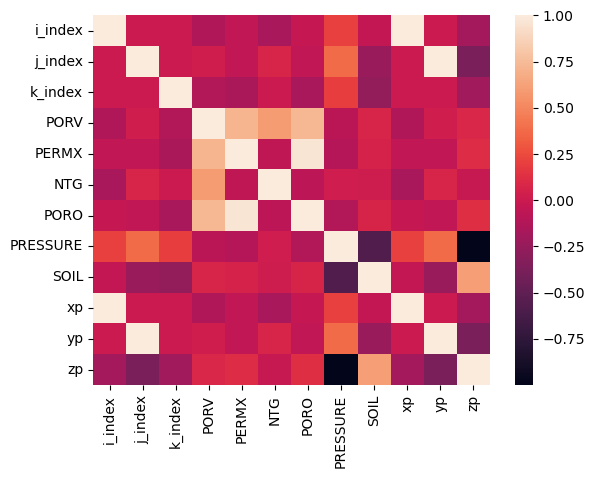

In [6]:
import seaborn as sns
sns.heatmap(dataset_corr, 
        xticklabels=dataset_corr.columns,
        yticklabels=dataset_corr.columns)

In [214]:

import plotly.graph_objects as go
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata



x = clustering_dataset['xp']
y = clustering_dataset['yp']
z = clustering_dataset['zp']

#x = clustering_test['xp']
#y = clustering_test['yp']
#z = clustering_test['zp']

#x --> Lon
#y --> Lat
#z --> Dept

#Plot formation tops

#create meshgrid
xi = np.arange(x.min(),x.max(),(x.max()-x.min())/100)
yi=np.arange(y.min(),y.max(),(y.max()-y.min())/100)
#zi=np.arange(z.min(),z.max(),(z.max()-z.min())/100)
#xi,yi,zi = np.meshgrid(xi,yi,zi)
xi,yi = np.meshgrid(xi,yi)

# interpolate
zi = griddata((x,y),z,(xi,yi),method='linear')


#Plot data
fig = go.Figure(data=go.Surface(z=zi, x=xi, y=yi,opacity=0.75, text='aaa', colorscale='Greens'))

fig.update_traces(contours_z=dict(show=True, usecolormap=True, highlightcolor="limegreen", project_z=True))

zoom=1.3
fig.update_layout(hovermode='closest',xaxis=dict(showspikes=False),scene_camera=dict(eye=dict(x=1*zoom, y=1*zoom, z=1*zoom)))

fig.update_layout(
    autosize=False,
    width=1050,
    height=1050)
fig.show()

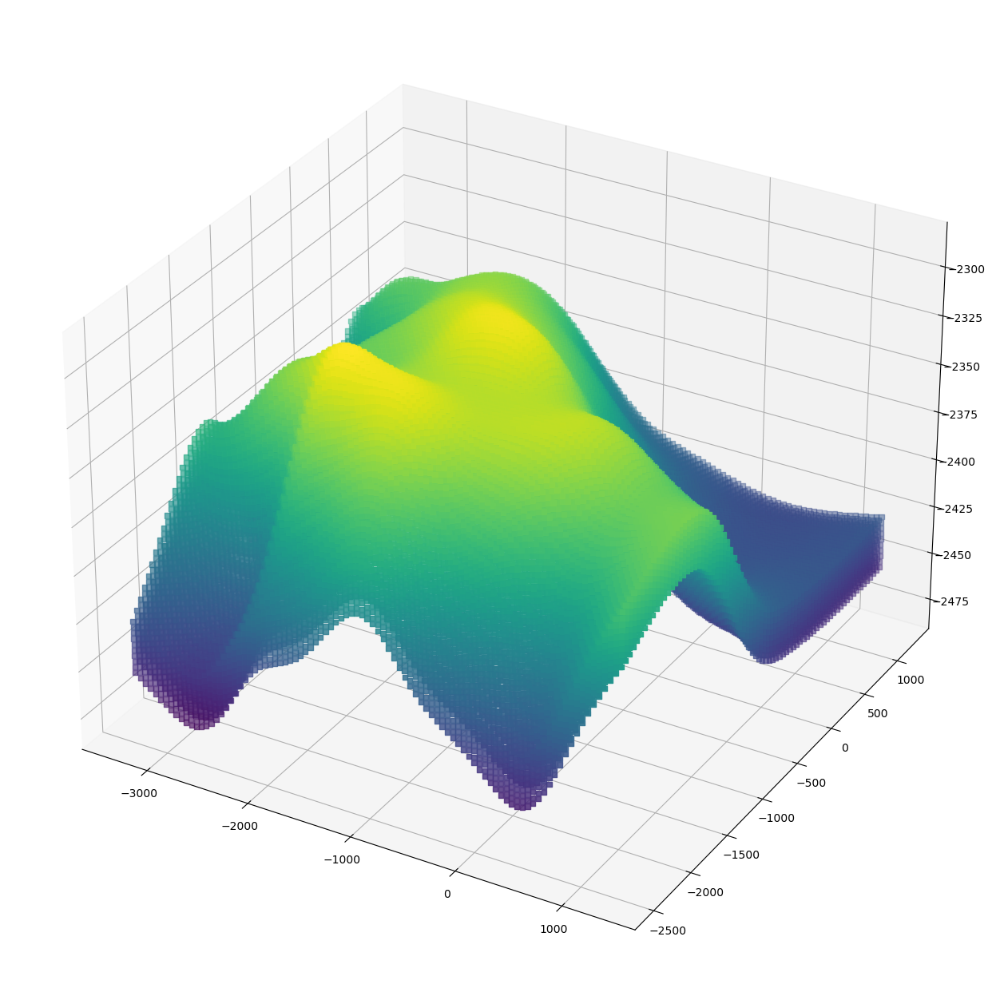

In [8]:
'''
==============
3D scatterplot
==============
Demonstration of a basic scatterplot in 3D.
'''

# Import libraries
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd

# Create figure object

fig = plt.figure(figsize=(16,16))

# Get the current axes, creating one if necessary.
ax = plt.subplot(projection='3d')



# By using zdir='y', the y value of these points is fixed to the zs value 0
# and the (x,y) points are plotted on the x and z axes.
ax.scatter(clustering_dataset['xp'], clustering_dataset['yp'],clustering_dataset['zp'], c=clustering_dataset['zp'], marker='s')





plt.show() #warto będzie zrobić interaktywny

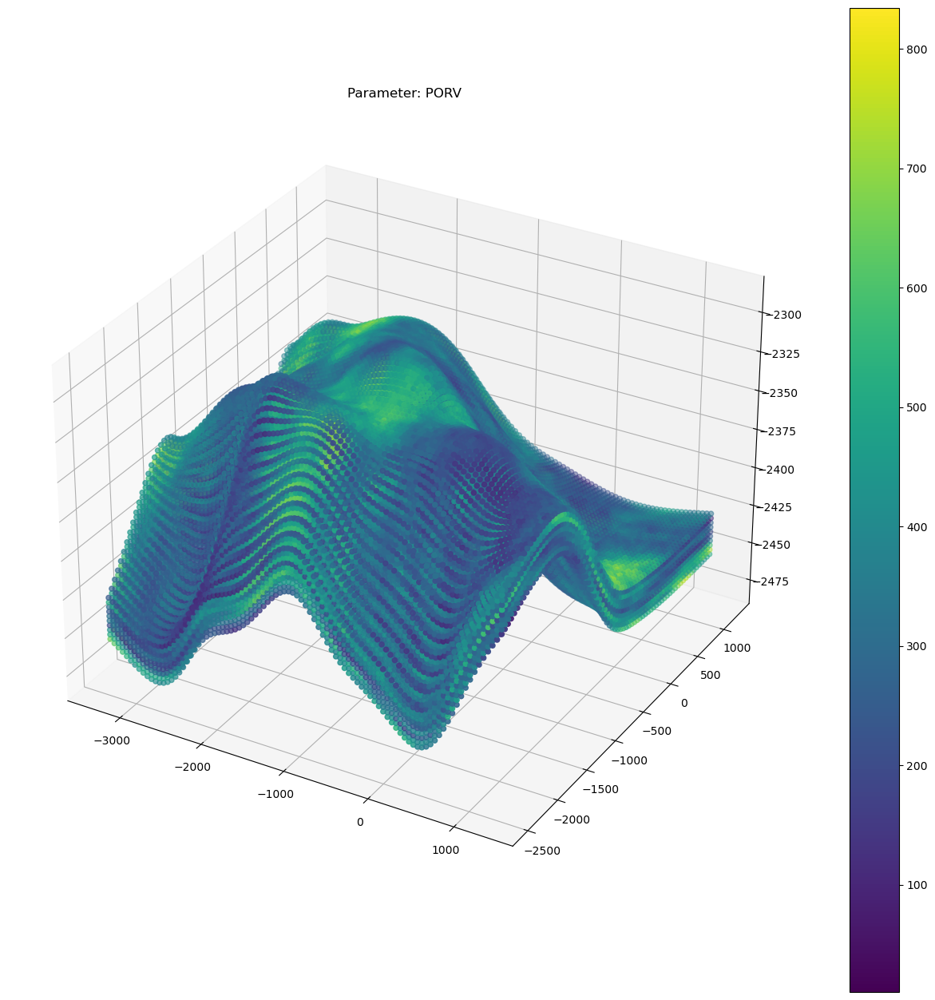

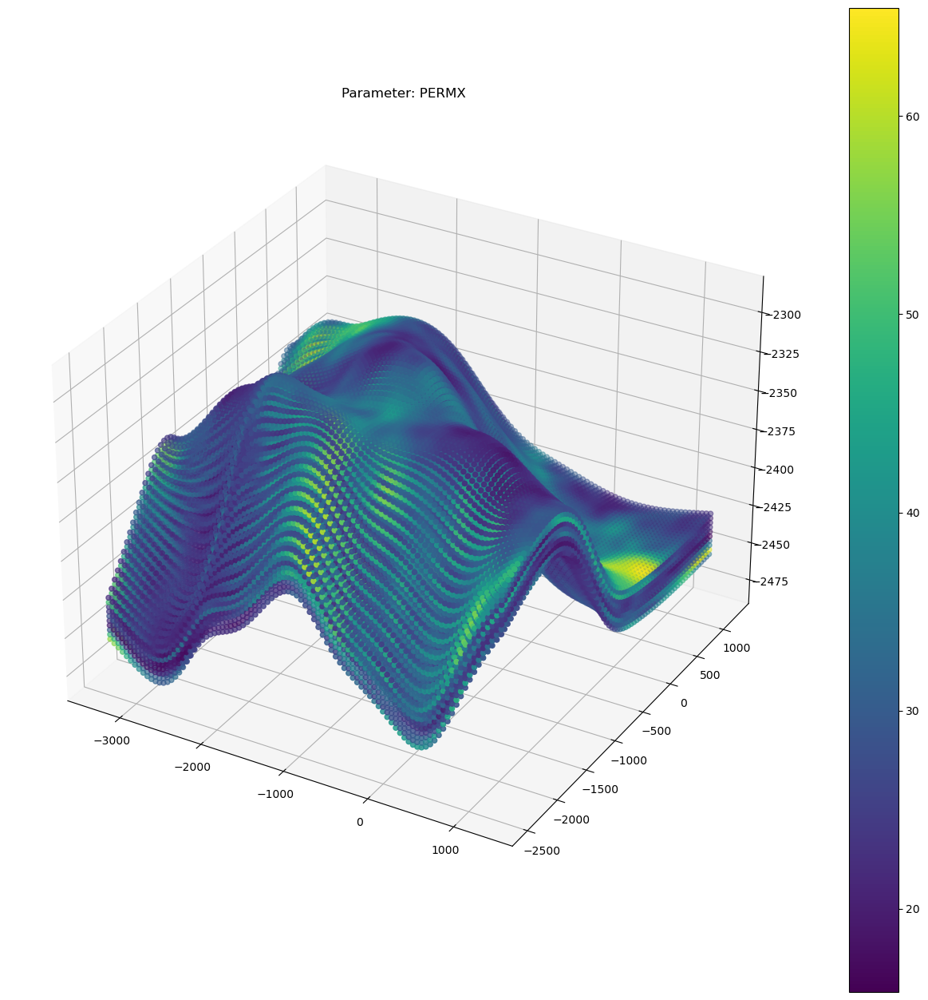

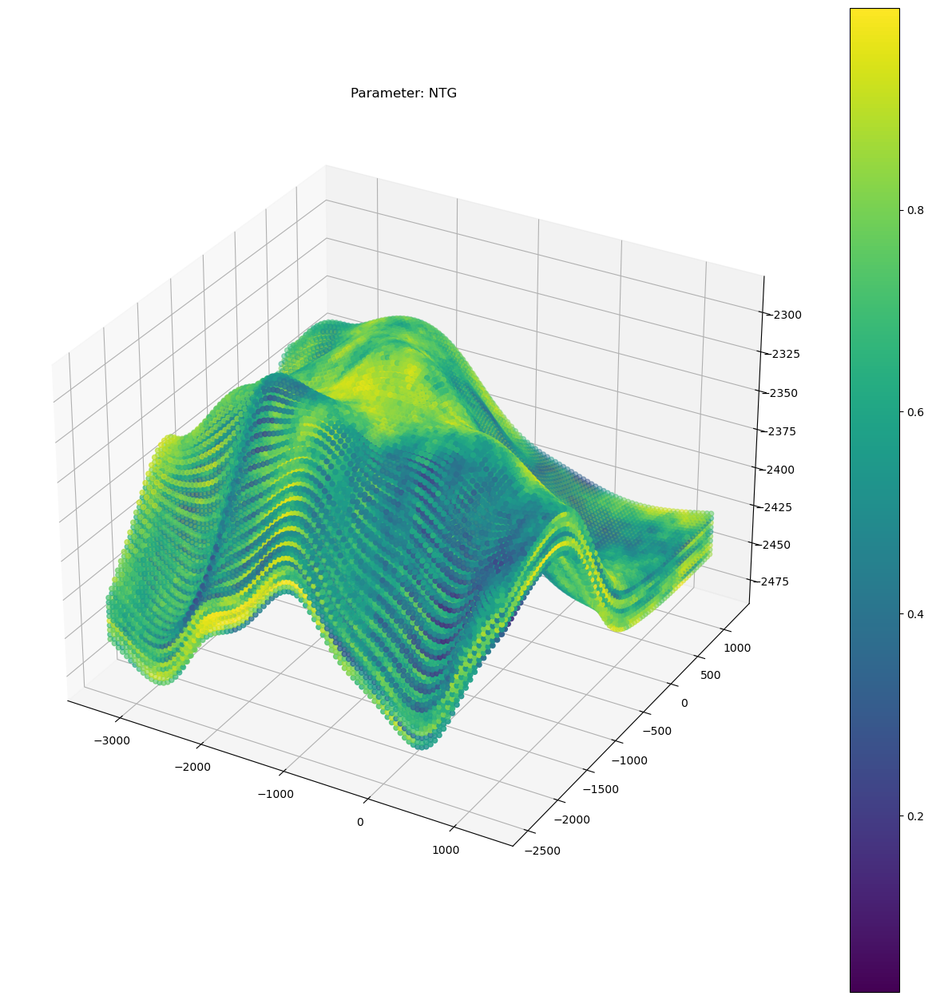

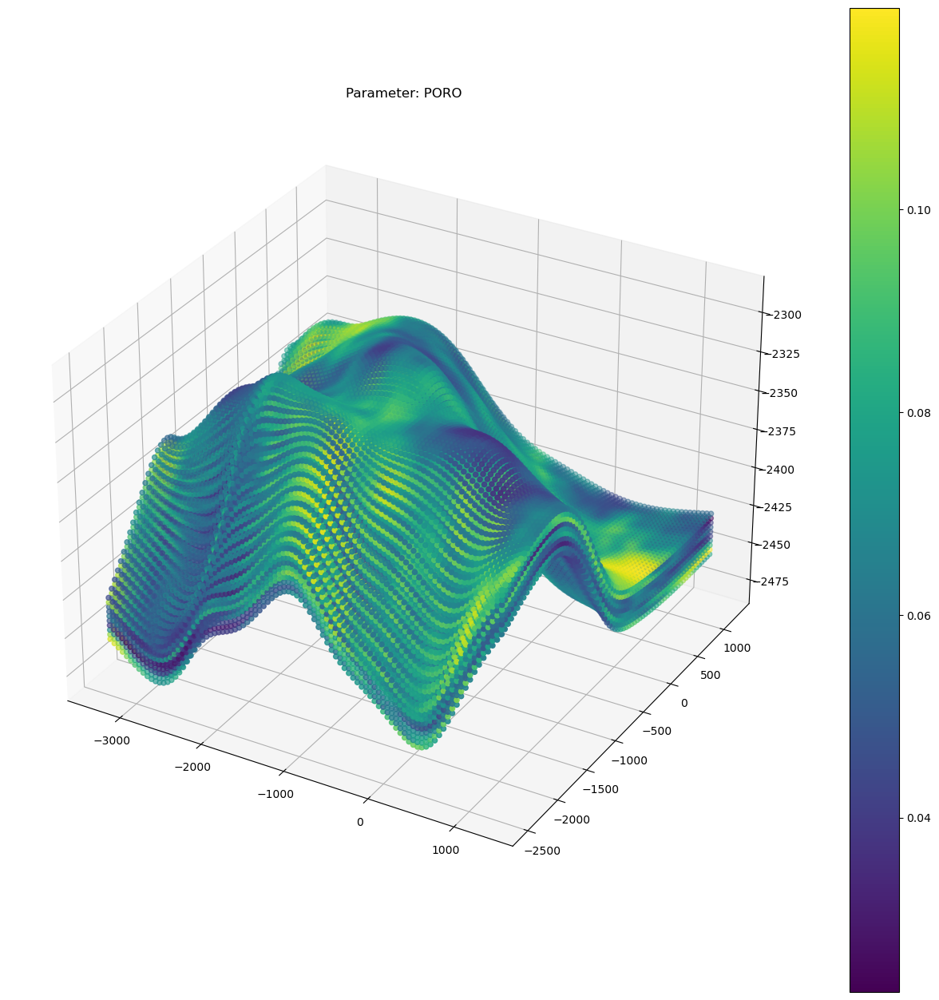

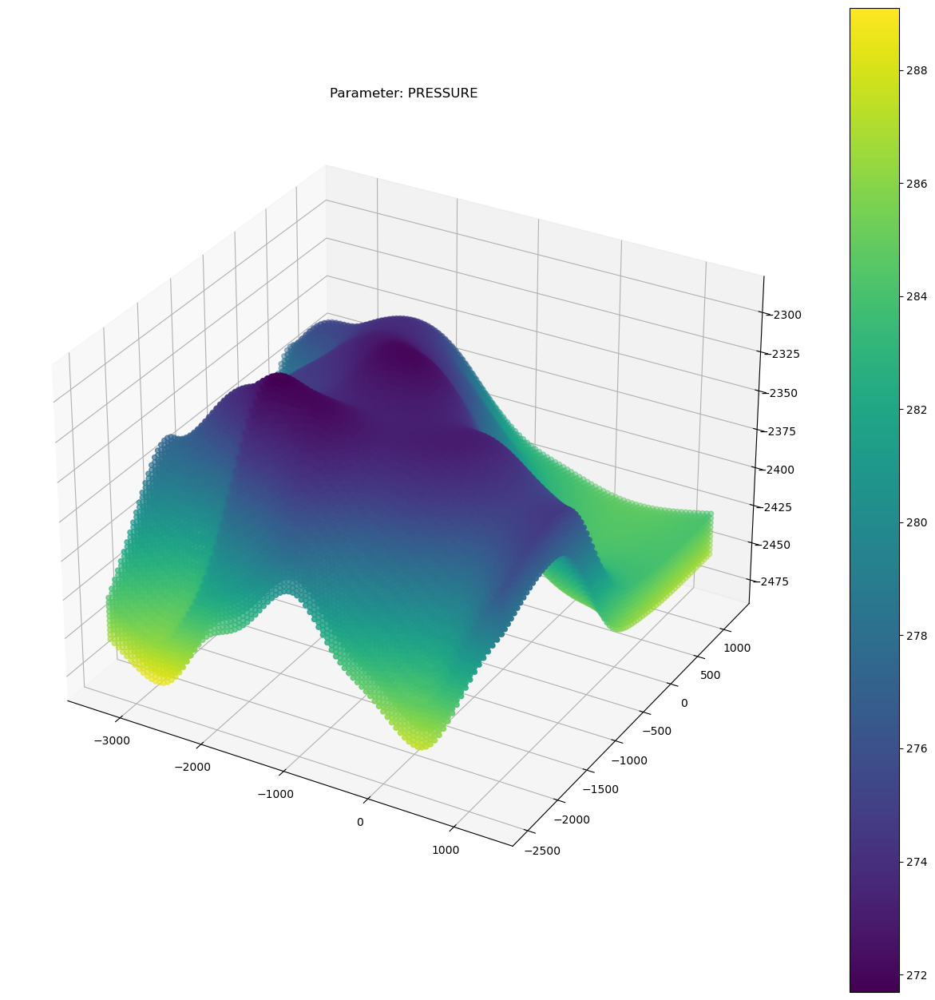

In [97]:
def fast_param_dist_3Dplot(x, y, z, param):
    fig = plt.figure(figsize=(16,16))
    ax = plt.subplot(projection='3d')
    
    #ax2.scatter(ds_clustered['xp'], ds_clustered['yp'],ds_clustered['zp'], c=ds_clustered['Clusters'])
    #ax.scatter(ds_clustered['xp'], ds_clustered['yp'],ds_clustered['zp'], c=ds_clustered['PORV'])
    dist_scatter = ax.scatter(x, y,z, c=param)
    plt.colorbar(dist_scatter, ax=ax)
    ax.set_title("Parameter: %s" % param.name)

    plt.show()

for column in clustering_dataset.columns[3:-4]:
    fast_param_dist_3Dplot(clustering_dataset['xp'], clustering_dataset['yp'],clustering_dataset['zp'], clustering_dataset[column])

In [10]:
from sklearn.cluster import DBSCAN

In [17]:
from itertools import product


eps_values = np.arange(8,20,0.25) # eps values to be investigated
min_samples = np.arange(3,10) # min_samples values to be investigated
#eps_values = [9, 10]
#min_samples = [3, 2]

def dbscan_model(param_eps, param_min_samples, dataset):
    DBSCAN_params = list(product(param_eps, param_min_samples))

    results = pd.DataFrame()
    results['eps'] = []
    results['min_samples'] = []
    results['number_of_clusters'] = []

    for p in DBSCAN_params:
        DBS_clustering = DBSCAN(eps=p[0], min_samples=p[1]).fit(dataset)
        results = pd.concat([results, pd.Series({
            'eps': p[0],
            'min_samples': p[1],
            'number_of_clusters':len(np.unique(DBS_clustering.labels_))}).to_frame().T], ignore_index=True)
        print('eps:', str(p[0]), 'min_samples:', str(p[1]), '------------', str(len(np.unique(DBS_clustering.labels_))))

    return results.sort_values(by=['number_of_clusters'], ascending=False)


##results.head()

#DBS_clustering = DBSCAN(eps=0.001, min_samples=2)
#DBS_clustering.fit(clustering_dataset)


#ds_clustered = clustering_dataset.copy()
#ds_clustered['Clusters'] = DBS_clustering.labels_

#DBSCAN_cluster_sizes = ds_clustered.groupby('Clusters').size().to_frame()
#DBSCAN_cluster_sizes



In [12]:
DBS_clustering = DBSCAN(eps=100, min_samples=70)
DBS_clustering.fit(clustering_dataset)


ds_clustered = clustering_dataset.copy()
ds_clustered['clusters'] = DBS_clustering.labels_

ds_clusters_only = ds_clustered[ds_clustered.clusters != -1]

DBSCAN_cluster_sizes = ds_clustered.groupby('clusters').size().to_frame()
DBSCAN_cluster_sizes

,0
clusters,
-1,63043
0,157
1,1403
2,874
3,345
4,270
5,1257
6,542
7,565


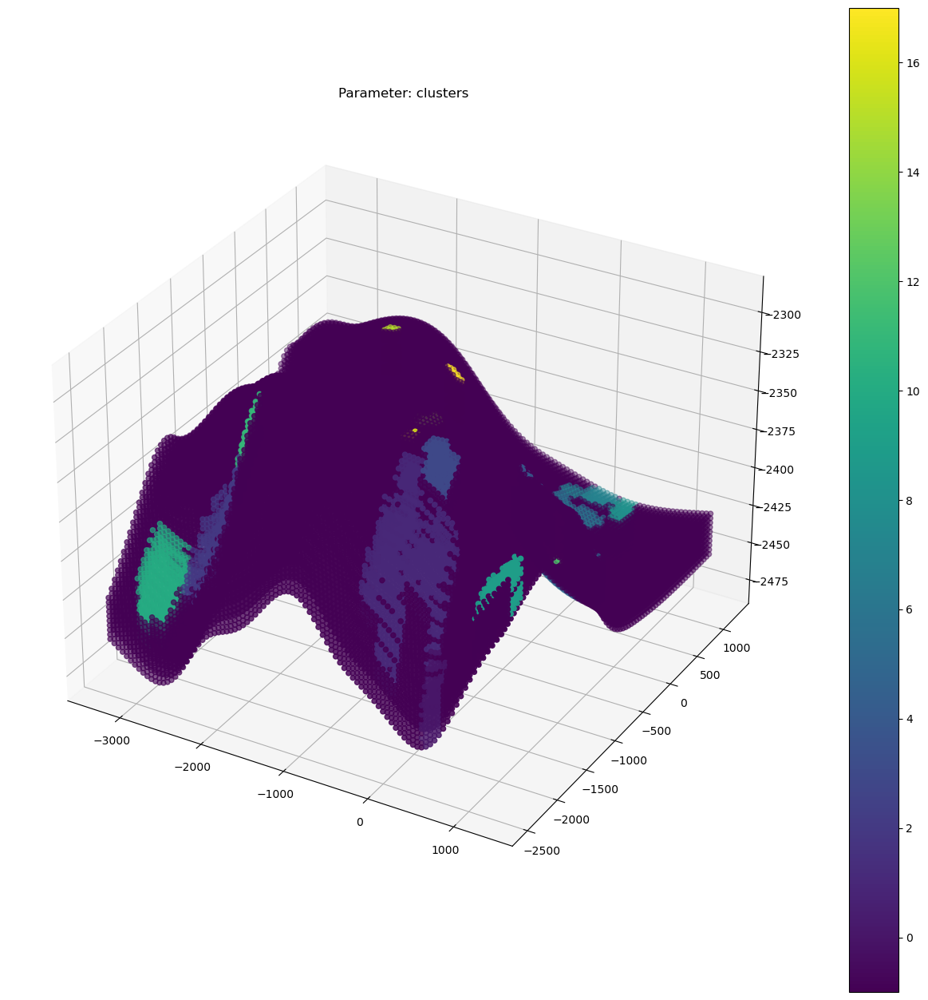

In [13]:
fast_param_dist_3Dplot(ds_clustered['xp'], ds_clustered['yp'],ds_clustered['zp'], ds_clustered['clusters'])

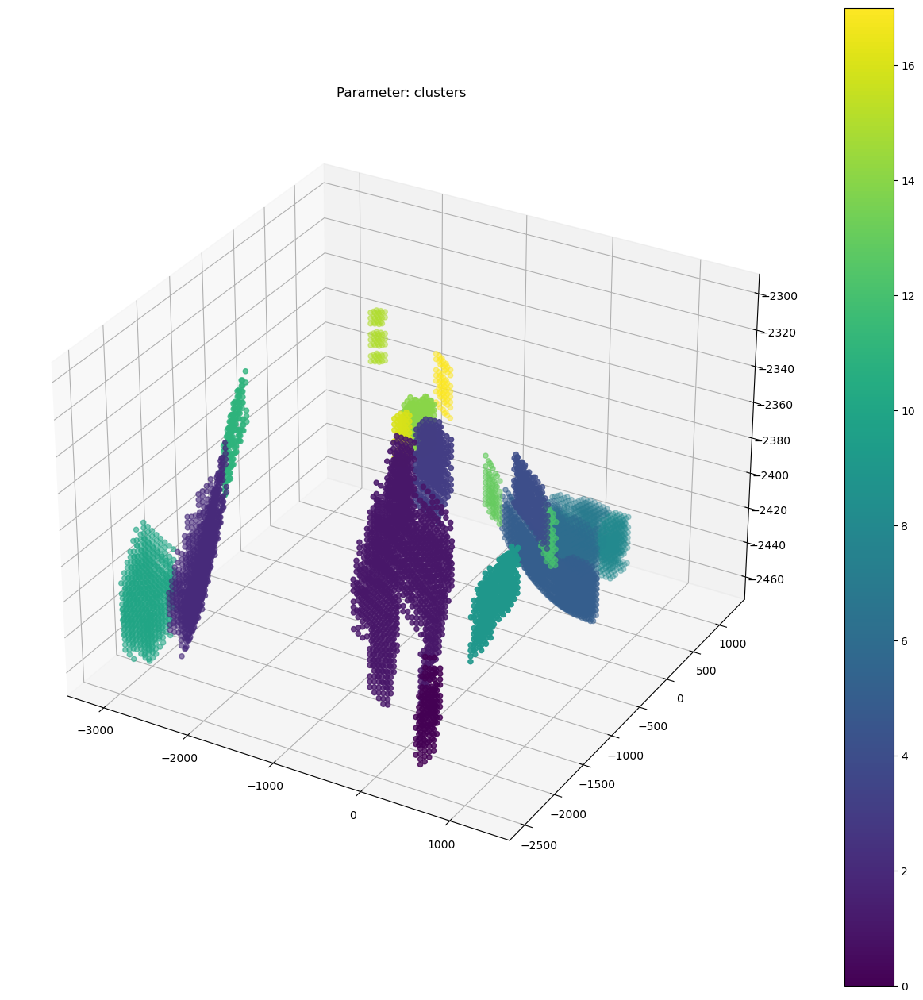

In [14]:
fast_param_dist_3Dplot(ds_clusters_only['xp'], ds_clusters_only['yp'],ds_clusters_only['zp'], ds_clusters_only['clusters'])

In [212]:
import plotly.express as px

fig3 = px.scatter_3d(ds_clustered, x='xp', y='yp', z='zp', color='clusters')
fig3.update_traces(marker={'size': 3})

fig3.show()

NameError: name 'ds_clustered' is not defined

In [16]:
import plotly.express as px

fig4 = px.scatter_3d(ds_clusters_only, x='xp', y='yp', z='zp', color='clusters')
fig4.update_traces(marker={'size': 3})
fig4.show()

OPTICS

In [17]:

from sklearn.cluster import OPTICS, cluster_optics_dbscan
import matplotlib.gridspec as gridspec


#eps_values = np.arange(8,20,0.25) # eps values to be investigated
#min_samples = np.arange(3,10) # min_samples values to be investigated
eps_values = [1, 10, 100]
min_samples = [1, 10, 50]

def optics_model(param_eps, param_min_samples, dataset):
    OPTICS_params = list(product(param_eps, param_min_samples))

    results = pd.DataFrame()
    results['eps'] = []
    results['min_samples'] = []
    results['number_of_clusters'] = []

    for p in OPTICS_params:
        OPTICS_clustering = OPTICS(eps=p[0], xi=.05, min_samples=p[1]).fit(dataset)
        results = pd.concat([results, pd.Series({
            'eps': p[0],
            'min_samples': p[1],
            'number_of_clusters':len(np.unique(OPTICS_clustering.labels_))}).to_frame().T], ignore_index=True)
        print('eps:', str(p[0]), 'min_samples:', str(p[1]), '------------', str(len(np.unique(OPTICS_clustering.labels_))))

    return results.sort_values(by=['number_of_clusters'], ascending=False)


results = optics_model(eps_values, min_samples, clustering_dataset)
results.head()

eps: 1 min_samples: 1 ------------ 1
eps: 1 min_samples: 10 ------------ 11
eps: 1 min_samples: 50 ------------ 1
eps: 10 min_samples: 1 ------------ 1
eps: 10 min_samples: 10 ------------ 11
eps: 10 min_samples: 50 ------------ 1
eps: 100 min_samples: 1 ------------ 1
eps: 100 min_samples: 10 ------------ 11
eps: 100 min_samples: 50 ------------ 1


,eps,min_samples,number_of_clusters
1,1.00,10.00,11.00
4,10.00,10.00,11.00
7,100.00,10.00,11.00
0,1.00,1.00,1.00
2,1.00,50.00,1.00


In [18]:
OPTICS_clustering = OPTICS(eps=0.0003, min_samples=10)
OPTICS_clustering.fit(clustering_dataset)


ds_clustered1 = clustering_dataset.copy()
ds_clustered1['clusters'] = OPTICS_clustering.labels_

ds_clusters_only1 = ds_clustered1[ds_clustered1.clusters != -1]

OPTICS_cluster_sizes = ds_clustered1.groupby('clusters').size().to_frame()
OPTICS_cluster_sizes

,0
clusters,
-1,70353
0,11
1,15
2,15
3,14
4,15
5,23
6,16
7,11


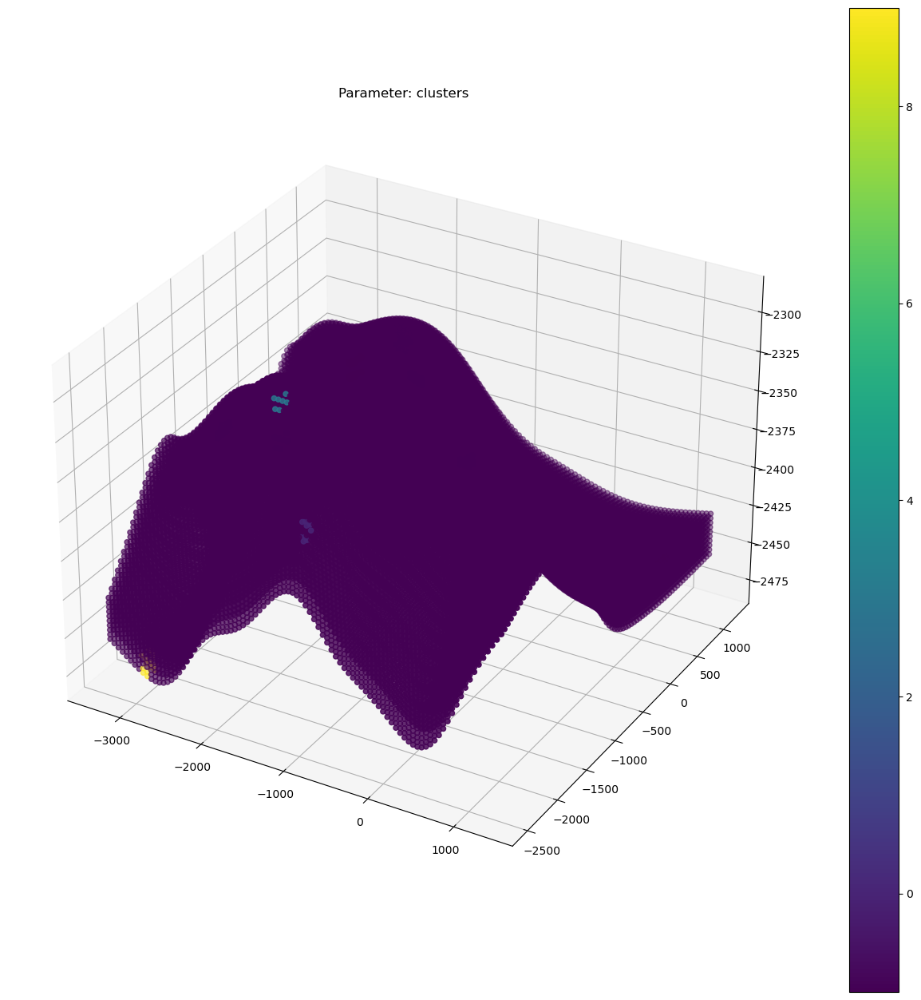

In [19]:
fast_param_dist_3Dplot(ds_clustered1['xp'], ds_clustered1['yp'],ds_clustered1['zp'], ds_clustered1['clusters'])

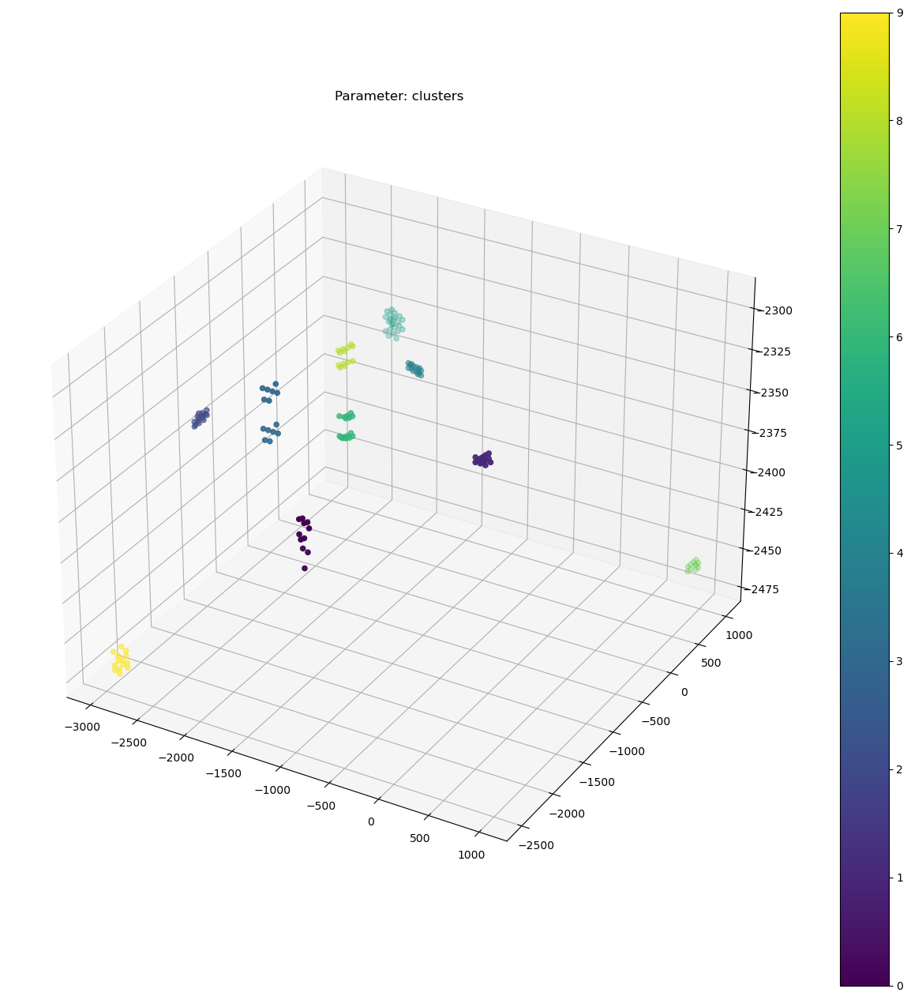

In [20]:
fast_param_dist_3Dplot(ds_clusters_only1['xp'], ds_clusters_only1['yp'], ds_clusters_only1['zp'], ds_clusters_only1['clusters'])

BIRCH

In [21]:
from sklearn.cluster import Birch

BIRCH_clustering = Birch(branching_factor=10, threshold=0.5, n_clusters=100)
BIRCH_clustering.fit(clustering_dataset)
labels = BIRCH_clustering.predict(clustering_dataset)

ds_clustered2 = clustering_dataset.copy()
ds_clustered2['clusters'] = BIRCH_clustering.labels_

ds_clusters_only2 = ds_clustered2[ds_clustered2.clusters != -1]

BIRCH_cluster_sizes = ds_clustered2.groupby('clusters').size().to_frame()
BIRCH_clusters = ds_clustered2.sort_values(by=['clusters'], ascending=False)
BIRCH_clusters

,i_index,j_index,k_index,PORV,PERMX,NTG,PORO,PRESSURE,SOIL,xp,yp,zp,clusters
32365,30,45,6,200.14,27.44,0.43,0.06,274.45,0.40,"-1,865.91",-278.28,"-2,327.80",99
18449,26,47,8,446.05,27.44,0.96,0.06,275.64,0.00,"-2,065.91",-178.28,"-2,340.82",99
31987,28,41,6,303.00,37.07,0.48,0.08,274.93,0.00,"-1,965.91",-478.28,"-2,333.56",99
11492,25,48,9,458.54,29.94,0.83,0.07,276.15,0.00,"-2,115.91",-128.28,"-2,346.00",99
11493,26,48,9,456.77,30.14,0.82,0.07,275.97,0.00,"-2,065.91",-128.28,"-2,344.17",99
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35948,41,8,5,577.03,37.98,0.89,0.09,274.41,0.43,"-1,315.91","-2,128.28","-2,327.33",0
35947,40,8,5,581.16,39.48,0.87,0.09,274.55,0.28,"-1,365.91","-2,128.28","-2,329.21",0
35946,39,8,5,529.57,38.94,0.80,0.09,274.70,0.03,"-1,415.91","-2,128.28","-2,331.24",0
35945,38,8,5,493.54,36.56,0.78,0.08,274.90,0.00,"-1,465.91","-2,128.28","-2,333.31",0


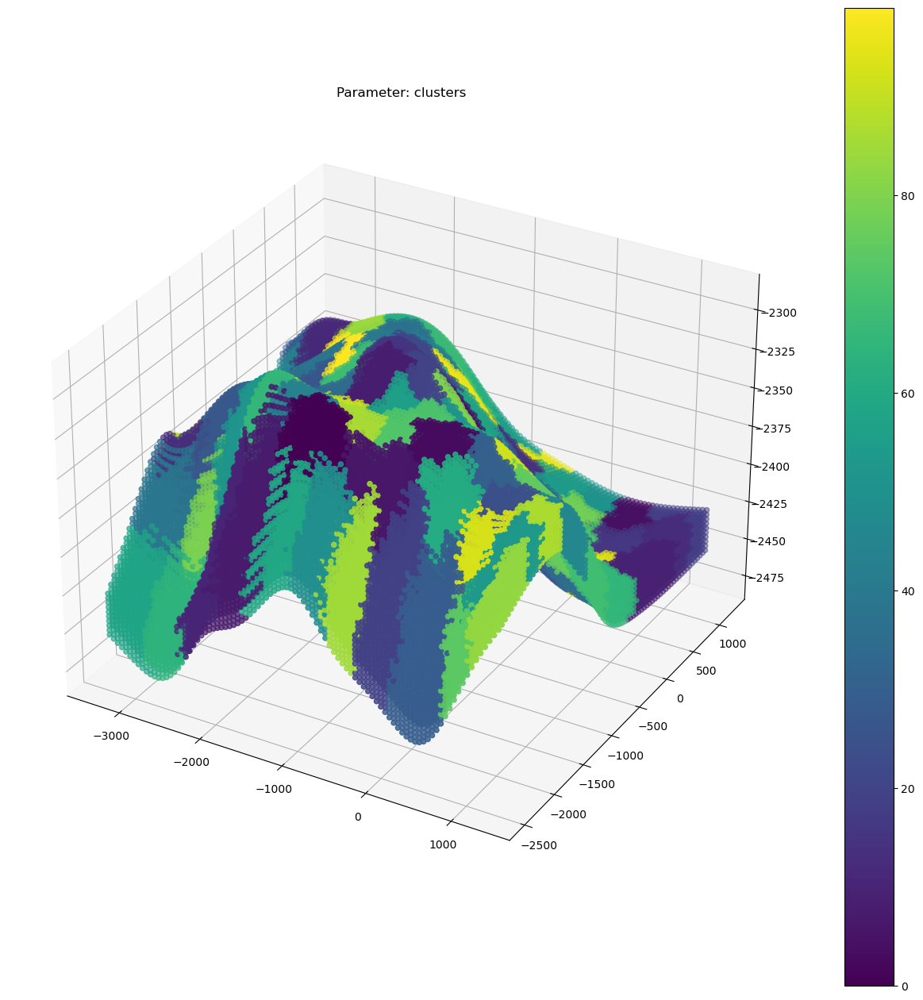

In [22]:
fast_param_dist_3Dplot(ds_clustered2['xp'], ds_clustered2['yp'],ds_clustered2['zp'], ds_clustered2['clusters'])

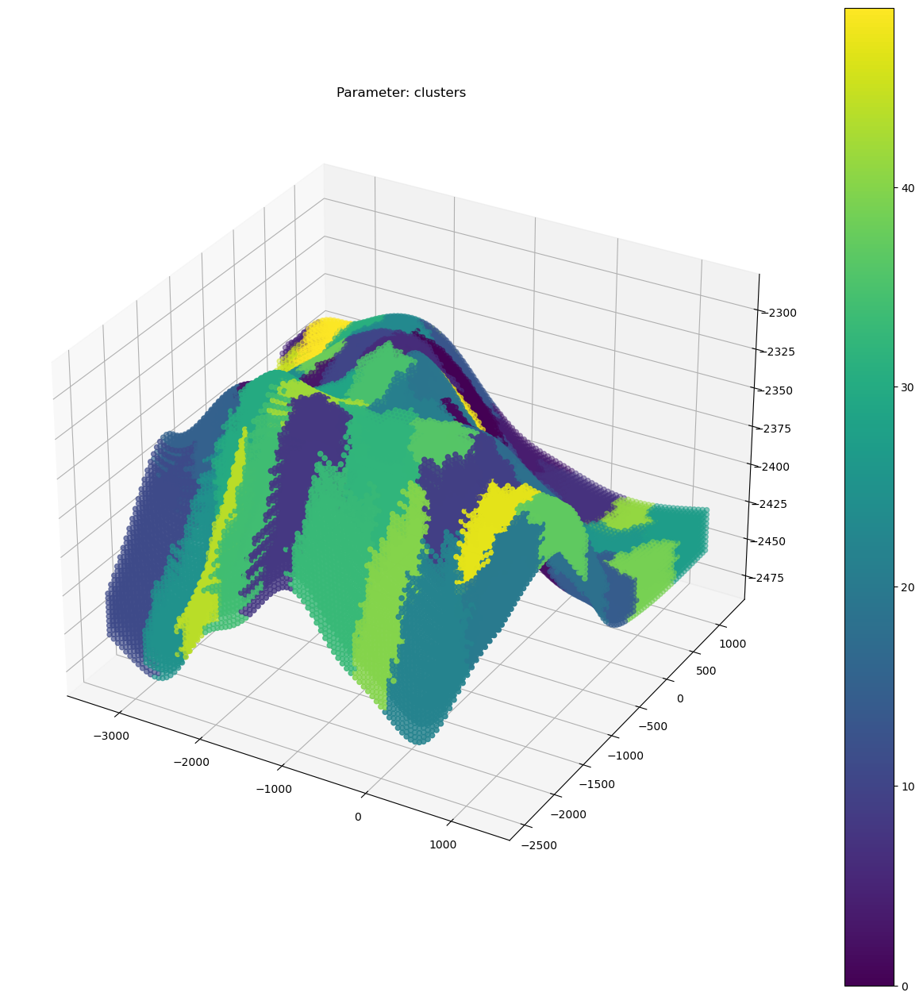

In [23]:
BIRCH_clustering = Birch(branching_factor=10, threshold=0.5, n_clusters=50)
BIRCH_clustering.fit(clustering_dataset)
labels = BIRCH_clustering.predict(clustering_dataset)

ds_clustered2 = clustering_dataset.copy()
ds_clustered2['clusters'] = BIRCH_clustering.labels_

ds_clusters_only2 = ds_clustered2[ds_clustered2.clusters != -1]

BIRCH_cluster_sizes = ds_clustered2.groupby('clusters').size().to_frame()
BIRCH_clusters = ds_clustered2.sort_values(by=['clusters'], ascending=False)
fast_param_dist_3Dplot(ds_clustered2['xp'], ds_clustered2['yp'],ds_clustered2['zp'], ds_clustered2['clusters'])

Redukcja wymiarowości

In [24]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
clustering_dataset2D = pca.fit_transform(clustering_dataset)

In [25]:
clustering_dataset2D

array([[ 2328.73939587, -1847.49833006],
       [ 2278.37138079, -1847.57552055],
       [ 2227.99683785, -1847.65365374],
       ...,
       [-2225.60901557,  1850.71555547],
       [-2276.01689363,  1850.5826588 ],
       [-2326.04721213,  1850.55753957]])

<AxesSubplot: >

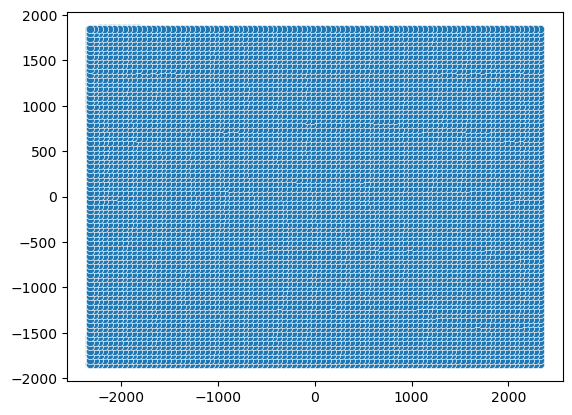

In [ ]:
sns.scatterplot(x=clustering_dataset2D[:,0], y=clustering_dataset2D[:,1], s=1)

<AxesSubplot: >

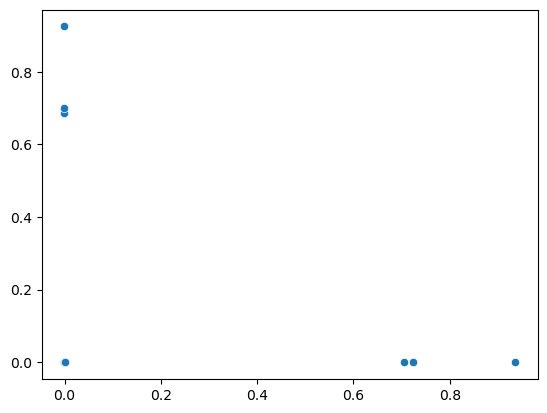

In [27]:
from sklearn.decomposition import KernelPCA
pca = KernelPCA(n_components=2, kernel='rbf', gamma=0.05, fit_inverse_transform=True)
clustering_dataset2D = pca.fit_transform(clustering_dataset)
sns.scatterplot(x=clustering_dataset2D[:,0], y=clustering_dataset2D[:,1])

In [44]:
clustering_dataset2D

array([[-3.25751565e-05, -3.16150568e-05],
       [-3.25751565e-05, -3.16150568e-05],
       [-3.25751565e-05, -3.16150568e-05],
       ...,
       [-3.25752485e-05, -3.16151547e-05],
       [-3.25751565e-05, -3.16150568e-05],
       [-3.25751565e-05, -3.16150568e-05]])

In [45]:
clustering_dataset2D[clustering_dataset2D[:,0] > 0.1]

array([[7.05832643e-01, 2.82346998e-04],
       [9.36060465e-01, 3.79958713e-04],
       [7.23794357e-01, 2.90253796e-04]])

679
3967
7729
11017
11182
14312
14779
18067
18232
21362
25282
28412
[[-3.25751565e-05 -3.16150568e-05]
 [-3.25751565e-05 -3.16150568e-05]
 [-3.25751565e-05 -3.16150568e-05]
 ...
 [-3.25752485e-05 -3.16151547e-05]
 [-3.25751565e-05 -3.16150568e-05]
 [-3.25751565e-05 -3.16150568e-05]]
[679, 3967, 7729, 11017, 11182, 14312, 14779, 18067, 18232, 21362, 25282, 28412]


<AxesSubplot: >

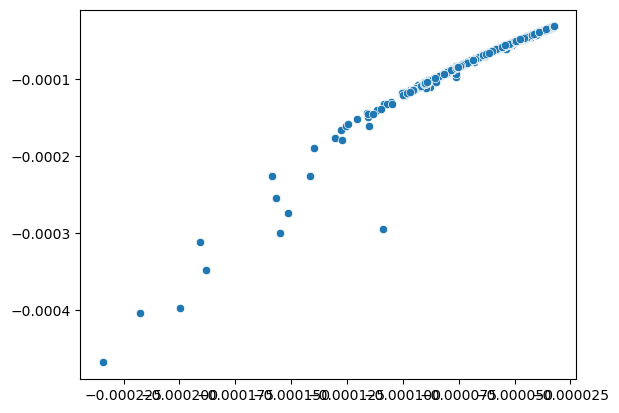

In [46]:
clustering_dataset2D2 = clustering_dataset2D
index_list = []
for n, i in enumerate(clustering_dataset2D2):
    if i[0] > 0.1 or i[1] > 0.1 or i[1] < -0.0005 :
        #print(clustering_dataset2D2[n,:])
        index_list.append(n)
        print(n)

clustering_dataset2D2 = np.delete(clustering_dataset2D2, index_list, axis=0)
print(clustering_dataset2D2)
        
print(index_list)
 
sns.scatterplot(x=clustering_dataset2D2[:,0], y=clustering_dataset2D2[:,1])

<AxesSubplot: >

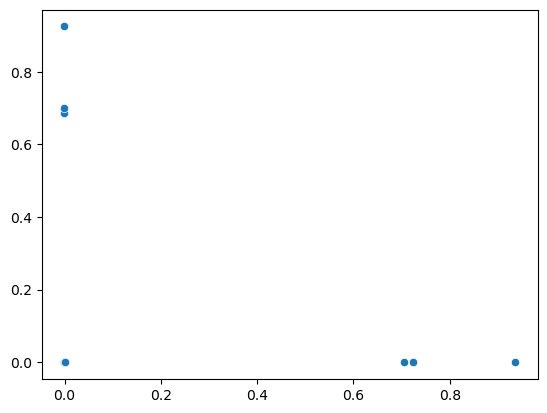

In [47]:
pca2 = KernelPCA(n_components=2, kernel='rbf', gamma=5, fit_inverse_transform=True)
clustering_dataset2D_1 = pca2.fit_transform(clustering_dataset)
sns.scatterplot(x=clustering_dataset2D_1[:,0], y=clustering_dataset2D_1[:,1])

679
3967
7729
11017
11182
14312
14779
18067
18232
21362
25282
28412
[[-3.25751565e-05 -3.16150568e-05]
 [-3.25751565e-05 -3.16150568e-05]
 [-3.25751565e-05 -3.16150568e-05]
 ...
 [-3.25752485e-05 -3.16151547e-05]
 [-3.25751565e-05 -3.16150568e-05]
 [-3.25751565e-05 -3.16150568e-05]]
[679, 3967, 7729, 11017, 11182, 14312, 14779, 18067, 18232, 21362, 25282, 28412]


<AxesSubplot: >

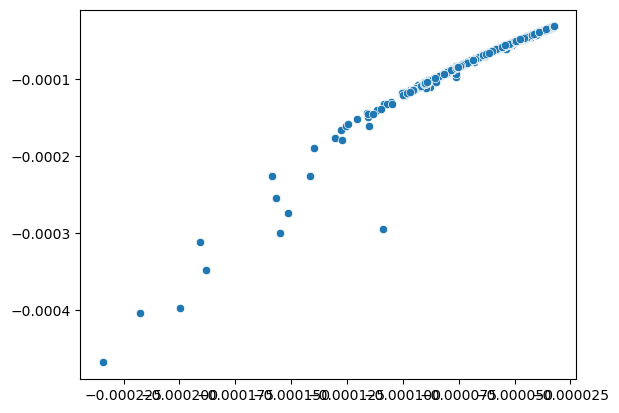

In [48]:
clustering_dataset2D2 = clustering_dataset2D_1
index_list = []
for n, i in enumerate(clustering_dataset2D2):
    if i[0] > 0.1 or i[1] > 0.1 or i[1] < -0.0005 :
        #print(clustering_dataset2D2[n,:])
        index_list.append(n)
        print(n)

clustering_dataset2D2 = np.delete(clustering_dataset2D2, index_list, axis=0)
print(clustering_dataset2D2)
        
print(index_list)
 
sns.scatterplot(x=clustering_dataset2D2[:,0], y=clustering_dataset2D2[:,1])

In [102]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
# transform data
clustering_dataset_scaled = scaler.fit_transform(clustering_dataset)
print(clustering_dataset_scaled)

[[-1.71372171 -1.70910872  1.5666989  ... -1.7137217  -1.70910872
  -1.89316081]
 [-1.67686748 -1.70910872  1.5666989  ... -1.67686747 -1.70910872
  -1.93833357]
 [-1.64001325 -1.70910872  1.5666989  ... -1.64001323 -1.70910872
  -1.98408886]
 ...
 [ 1.64001325  1.70910872 -1.5666989  ...  1.64001325  1.70910871
  -1.27972295]
 [ 1.67686748  1.70910872 -1.5666989  ...  1.67686748  1.70910871
  -1.26478037]
 [ 1.71372171  1.70910872 -1.5666989  ...  1.71372171  1.70910871
  -1.24983778]]


In [5]:
from sklearn.decomposition import KernelPCA
pca3 = KernelPCA(n_components=2, kernel='rbf', gamma=0.05, fit_inverse_transform=True)
clustering_dataset2D_2 = pca3.fit_transform(clustering_dataset_scaled)


<AxesSubplot: >

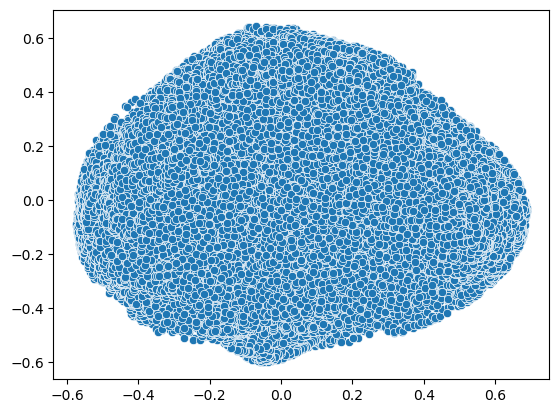

In [7]:
import seaborn as sns
sns.scatterplot(x=clustering_dataset2D_2[:,0], y=clustering_dataset2D_2[:,1])

<AxesSubplot: >

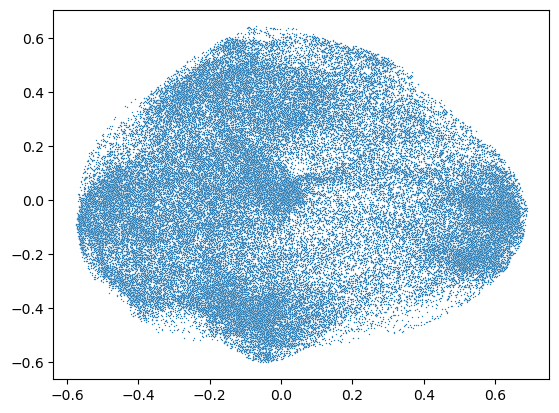

In [8]:
sns.scatterplot(x=clustering_dataset2D_2[:,0], y=clustering_dataset2D_2[:,1], s=1)

In [60]:
pca4 = KernelPCA(n_components=2, kernel='rbf', gamma=0.35, fit_inverse_transform=True)
clustering_dataset2D_3 = pca4.fit_transform(clustering_dataset_scaled)

<AxesSubplot: >

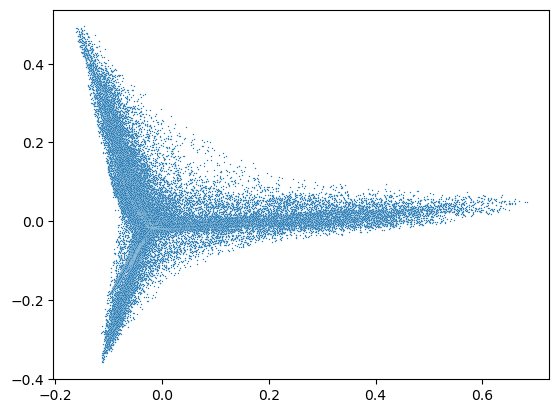

In [61]:
sns.scatterplot(x=clustering_dataset2D_3[:,0], y=clustering_dataset2D_3[:,1], s=1)

In [62]:
pca5 = KernelPCA(n_components=2, kernel='sigmoid', gamma=0.05, fit_inverse_transform=True)
clustering_dataset2D_4 = pca5.fit_transform(clustering_dataset_scaled)

<AxesSubplot: >

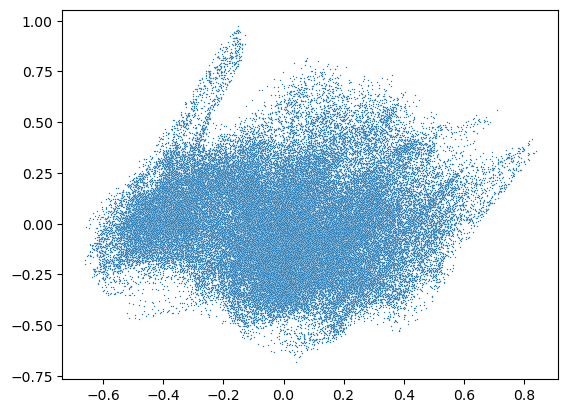

In [63]:
sns.scatterplot(x=clustering_dataset2D_4[:,0], y=clustering_dataset2D_4[:,1], s=1)

In [64]:
pca6 = KernelPCA(n_components=2, kernel='sigmoid', gamma=0.35, fit_inverse_transform=True)
clustering_dataset2D_5 = pca6.fit_transform(clustering_dataset_scaled)

In [ ]:
sns.scatterplot(x=clustering_dataset2D_5[:,0], y=clustering_dataset2D_5[:,1], s=1)

In [66]:
pca7 = KernelPCA(n_components=2, kernel='sigmoid', gamma=0.65, fit_inverse_transform=True)
clustering_dataset2D_6 = pca7.fit_transform(clustering_dataset_scaled)

<AxesSubplot: >

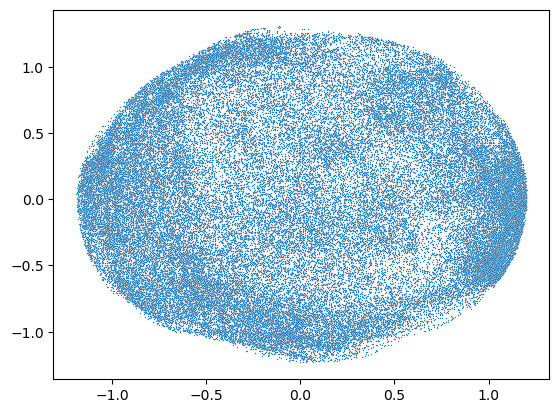

In [67]:
sns.scatterplot(x=clustering_dataset2D_6[:,0], y=clustering_dataset2D_6[:,1], s=1)

### Algorytm t-SNE
* Stochastyczne zanurzenie sąsiadów przy jednoczesnym uzyciu rozkładu t
* Redukuje wymiarowość, przy jednoczesnej próbie grupowania podobnych przykładów.

In [190]:
from sklearn.manifold import TSNE
tsne1 = TSNE(n_components=2, perplexity=5)
clustering_dataset_2D_tsne_1 = tsne1.fit_transform(clustering_dataset_scaled)

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



<AxesSubplot: >

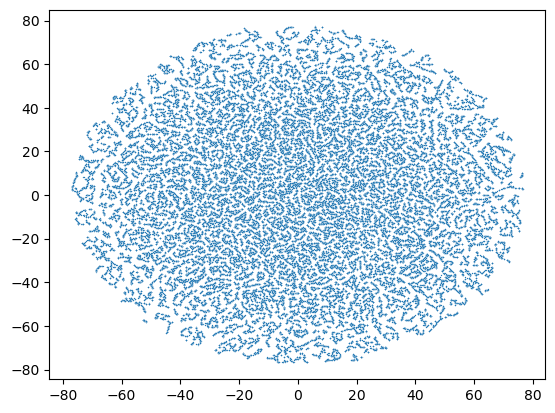

In [191]:
sns.scatterplot(x=clustering_dataset_2D_tsne_1[:,0], y=clustering_dataset_2D_tsne_1[:,1], s=1)

In [192]:
tsne2 = TSNE(n_components=2, perplexity=50)
clustering_dataset_2D_tsne_2 = tsne2.fit_transform(clustering_dataset_scaled)

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



<AxesSubplot: >

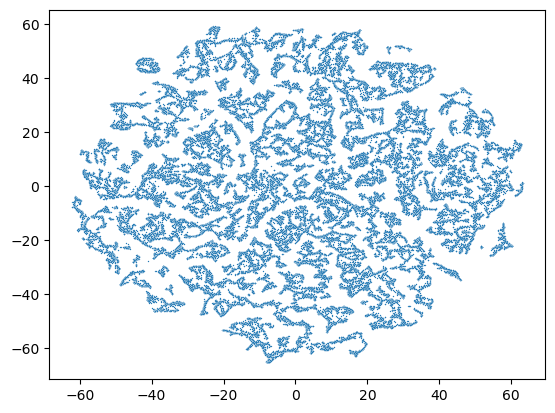

In [193]:
sns.scatterplot(x=clustering_dataset_2D_tsne_2[:,0], y=clustering_dataset_2D_tsne_2[:,1], s=1)

In [194]:
tsne3 = TSNE(n_components=2, perplexity=100)
clustering_dataset_2D_tsne_3 = tsne3.fit_transform(clustering_dataset_scaled)

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



<AxesSubplot: >

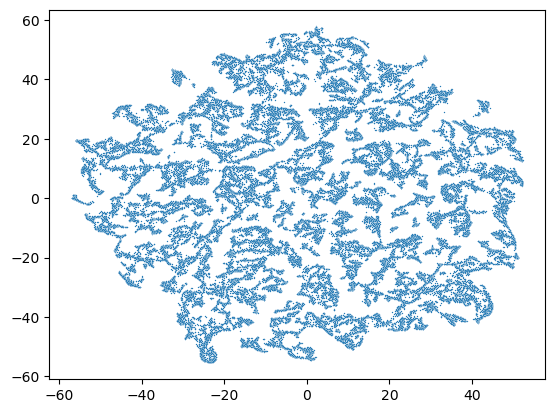

In [195]:
sns.scatterplot(x=clustering_dataset_2D_tsne_3[:,0], y=clustering_dataset_2D_tsne_3[:,1], s=1)

In [196]:
#dane bez skalowania(standaryzacji)
tsne4 = TSNE(n_components=2, perplexity=100)
clustering_dataset_2D_tsne_4 = tsne4.fit_transform(clustering_dataset)

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



<AxesSubplot: >

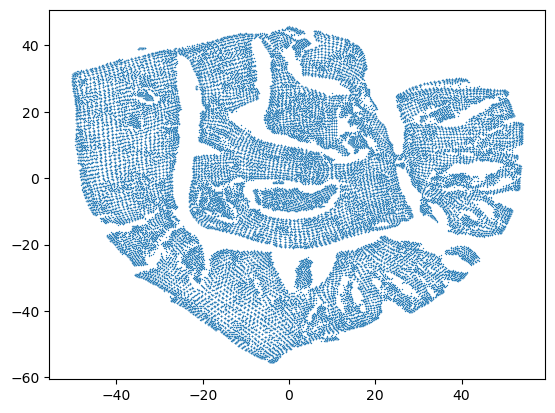

In [197]:
sns.scatterplot(x=clustering_dataset_2D_tsne_4[:,0], y=clustering_dataset_2D_tsne_4[:,1], s=1)

In [198]:
tsne5 = TSNE(n_components=2, perplexity=10)
clustering_dataset_2D_tsne_5 = tsne5.fit_transform(clustering_dataset)

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/Users/pawelmichalski/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



<AxesSubplot: >

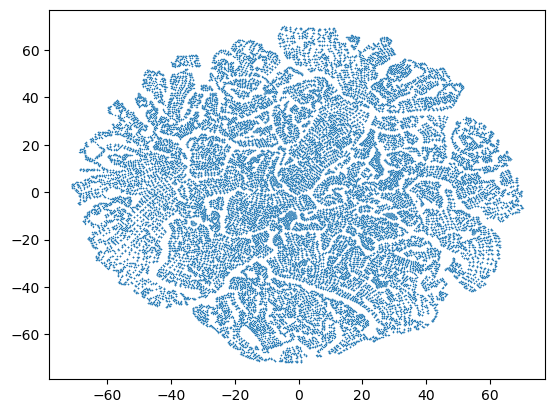

In [199]:
sns.scatterplot(x=clustering_dataset_2D_tsne_5[:,0], y=clustering_dataset_2D_tsne_5[:,1], s=1)

### Algorytm LLE

* Algorytm lokalnie liniowego zanurzenia
* Metoda uczenia rozmaitościowego niewykorzystująca koncepcji rzutowania
* Polega na zmierzeniu liniowej zalezności próbki uczącej od jej najbliszych sąsiadów, a nastepnie na wyszukaniu małowymiarowej reprezentacji zbioru danych


In [200]:
from sklearn.manifold import LocallyLinearEmbedding
lle1 = LocallyLinearEmbedding(n_components=2, n_neighbors=10)
clustering_dataset_2D_lle_1 = lle1.fit_transform(clustering_dataset_scaled)

<AxesSubplot: >

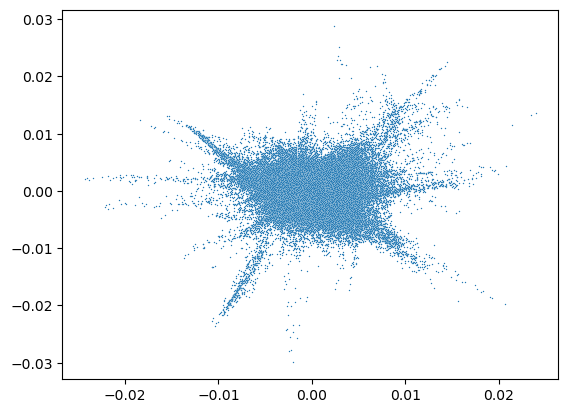

In [201]:
sns.scatterplot(x=clustering_dataset_2D_lle_1[:,0], y=clustering_dataset_2D_lle_1[:,1], s=1)

<AxesSubplot: >

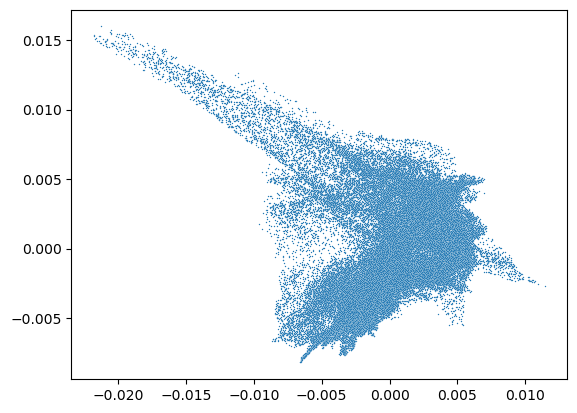

In [202]:
lle2 = LocallyLinearEmbedding(n_components=2, n_neighbors=100)
clustering_dataset_2D_lle_2 = lle2.fit_transform(clustering_dataset_scaled)
sns.scatterplot(x=clustering_dataset_2D_lle_2[:,0], y=clustering_dataset_2D_lle_2[:,1], s=1)

<AxesSubplot: >

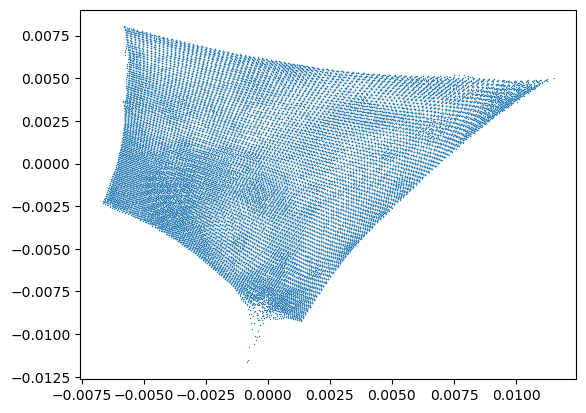

In [209]:
#bez standaryzacji cech
lle5 = LocallyLinearEmbedding(n_components=2, n_neighbors=9)
clustering_dataset_2D_lle_5 = lle5.fit_transform(clustering_dataset)
sns.scatterplot(x=clustering_dataset_2D_lle_5[:,0], y=clustering_dataset_2D_lle_5[:,1], s=1)

<AxesSubplot: >

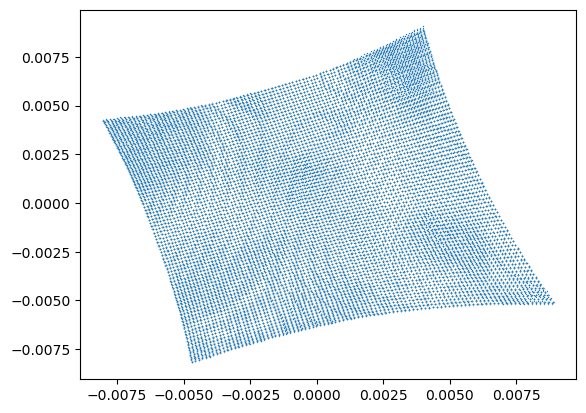

In [211]:
#bez standaryzacji cech
lle3 = LocallyLinearEmbedding(n_components=2, n_neighbors=25)
clustering_dataset_2D_lle_3 = lle3.fit_transform(clustering_dataset)
sns.scatterplot(x=clustering_dataset_2D_lle_3[:,0], y=clustering_dataset_2D_lle_3[:,1], s=1)

<AxesSubplot: >

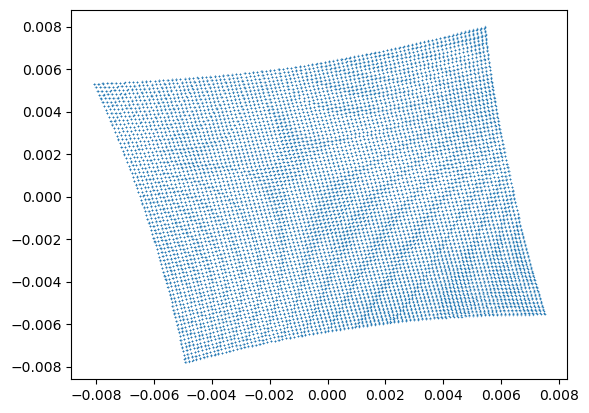

In [204]:
lle4 = LocallyLinearEmbedding(n_components=2, n_neighbors=100)
clustering_dataset_2D_lle_4 = lle4.fit_transform(clustering_dataset)
sns.scatterplot(x=clustering_dataset_2D_lle_4[:,0], y=clustering_dataset_2D_lle_4[:,1], s=1)

### Klasteryzacja danych po redukcji wymiarowości

In [36]:
from sklearn.cluster import DBSCAN
eps_values = np.arange(0.0005,0.05,0.005) # eps values to be investigated
min_samples = np.arange(50,1000, 50) # min_samples values to be investigated
#eps_values = [1, 10, 100]
#min_samples = [1, 10, 50]
results = dbscan_model(eps_values, min_samples, pd.DataFrame(clustering_dataset2D_2))

eps: 0.0005 min_samples: 50 ------------ 1
eps: 0.0005 min_samples: 100 ------------ 1
eps: 0.0005 min_samples: 150 ------------ 1
eps: 0.0005 min_samples: 200 ------------ 1
eps: 0.0005 min_samples: 250 ------------ 1
eps: 0.0005 min_samples: 300 ------------ 1
eps: 0.0005 min_samples: 350 ------------ 1
eps: 0.0005 min_samples: 400 ------------ 1
eps: 0.0005 min_samples: 450 ------------ 1
eps: 0.0005 min_samples: 500 ------------ 1
eps: 0.0005 min_samples: 550 ------------ 1
eps: 0.0005 min_samples: 600 ------------ 1
eps: 0.0005 min_samples: 650 ------------ 1
eps: 0.0005 min_samples: 700 ------------ 1
eps: 0.0005 min_samples: 750 ------------ 1
eps: 0.0005 min_samples: 800 ------------ 1
eps: 0.0005 min_samples: 850 ------------ 1
eps: 0.0005 min_samples: 900 ------------ 1
eps: 0.0005 min_samples: 950 ------------ 1
eps: 0.0055 min_samples: 50 ------------ 1
eps: 0.0055 min_samples: 100 ------------ 1
eps: 0.0055 min_samples: 150 ------------ 1
eps: 0.0055 min_samples: 200 -----

In [62]:
results.sort_values(['eps', 'number_of_clusters'], ascending=False)

,eps,min_samples,number_of_clusters
181,0.0455,550.0,7.0
182,0.0455,600.0,7.0
184,0.0455,700.0,7.0
187,0.0455,850.0,6.0
183,0.0455,650.0,6.0
...,...,...,...
16,0.0005,850.0,1.0
17,0.0005,900.0,1.0
18,0.0005,950.0,1.0
1,0.0005,100.0,1.0


In [40]:

DBS_clustering_1 = DBSCAN(eps=0.0455, min_samples=950)
DBS_clustering_1.fit(clustering_dataset2D_2)

ds_reduced_clustered = pd.DataFrame(clustering_dataset2D_2)
ds_reduced_clustered['clusters'] = DBS_clustering_1.labels_

#ds_clusters_only = ds_clustered[ds_clustered.clusters != -1]

DBSCAN_cluster_sizes = ds_reduced_clustered.groupby('clusters').size().to_frame()
DBSCAN_cluster_sizes



,0
clusters,
-1,60660
0,2220
1,3846
2,3774


<AxesSubplot: xlabel='0', ylabel='1'>

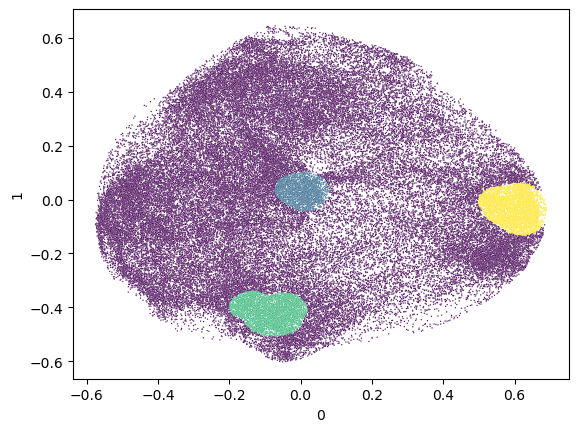

In [55]:
sns.scatterplot(x=ds_reduced_clustered.loc[:,0],y=ds_reduced_clustered.loc[:,1], c=ds_reduced_clustered['clusters'], s=1)

In [60]:
DBS_clustering_1 = DBSCAN(eps=0.0105, min_samples=50)
DBS_clustering_1.fit(clustering_dataset2D_2)

ds_reduced_clustered = pd.DataFrame(clustering_dataset2D_2)
ds_reduced_clustered['clusters'] = DBS_clustering_1.labels_

#ds_clusters_only = ds_clustered[ds_clustered.clusters != -1]

DBSCAN_cluster_sizes = ds_reduced_clustered.groupby('clusters').size().to_frame()
DBSCAN_cluster_sizes


,0
clusters,
-1,55002
0,465
1,2306
2,3627
3,47
4,170
5,148
6,183
7,25


<AxesSubplot: xlabel='0', ylabel='1'>

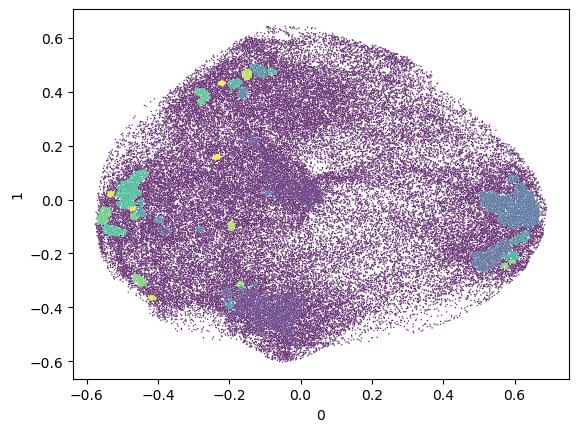

In [61]:
sns.scatterplot(x=ds_reduced_clustered.loc[:,0],y=ds_reduced_clustered.loc[:,1], c=ds_reduced_clustered['clusters'], s=1)

In [63]:
DBS_clustering_1 = DBSCAN(eps=0.0455, min_samples=550)
DBS_clustering_1.fit(clustering_dataset2D_2)

ds_reduced_clustered = pd.DataFrame(clustering_dataset2D_2)
ds_reduced_clustered['clusters'] = DBS_clustering_1.labels_

#ds_clusters_only = ds_clustered[ds_clustered.clusters != -1]

DBSCAN_cluster_sizes = ds_reduced_clustered.groupby('clusters').size().to_frame()
DBSCAN_cluster_sizes

,0
clusters,
-1,22795
0,17586
1,8761
2,1132
3,9517
4,9215
5,1494


<AxesSubplot: xlabel='0', ylabel='1'>

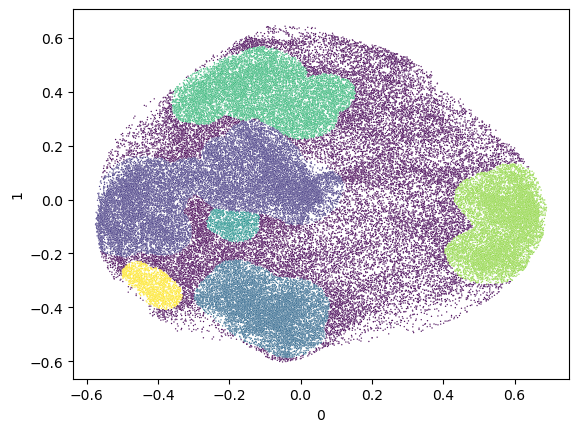

In [64]:
sns.scatterplot(x=ds_reduced_clustered.loc[:,0],y=ds_reduced_clustered.loc[:,1], c=ds_reduced_clustered['clusters'], s=1)

<AxesSubplot: xlabel='0', ylabel='1'>

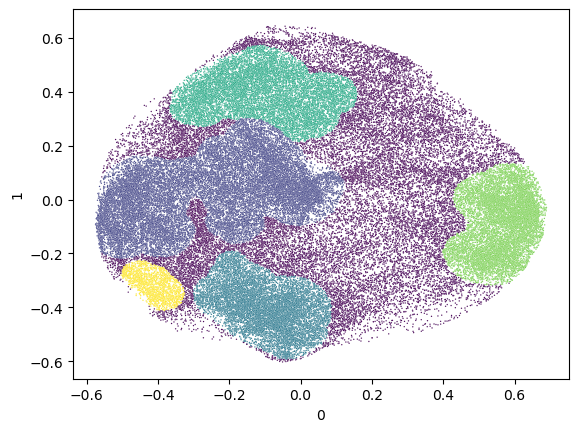

In [90]:
DBS_clustering_1 = DBSCAN(eps=0.047, min_samples=570)
DBS_clustering_1.fit(clustering_dataset2D_2)

ds_reduced_clustered = pd.DataFrame(clustering_dataset2D_2)
ds_reduced_clustered['clusters'] = DBS_clustering_1.labels_

#ds_clusters_only = ds_clustered[ds_clustered.clusters != -1]

DBSCAN_cluster_sizes = ds_reduced_clustered.groupby('clusters').size().to_frame()
DBSCAN_cluster_sizes.head()
sns.scatterplot(x=ds_reduced_clustered.loc[:,0],y=ds_reduced_clustered.loc[:,1], c=ds_reduced_clustered['clusters'], s=1)

### Transformacja odwrotna

In [91]:
clustering_dataset_recovered = pca3.inverse_transform(clustering_dataset2D_2)

In [104]:
clustering_dataframe_recovered = pd.DataFrame(clustering_dataset_recovered, columns=clustering_dataset.columns)
clustering_dataframe_recovered

,i_index,j_index,k_index,PORV,PERMX,NTG,PORO,PRESSURE,SOIL,xp,yp,zp
0,-0.551992,-0.080410,0.077394,0.184840,0.174729,0.171948,0.120861,-0.084727,-0.217938,-0.551992,-0.080410,0.075720
1,-0.551087,-0.079570,0.078106,0.183693,0.173787,0.171485,0.119860,-0.083121,-0.219517,-0.551087,-0.079570,0.074092
2,-0.558001,-0.072892,0.077515,0.188913,0.176426,0.175660,0.122709,-0.081374,-0.222592,-0.558001,-0.072892,0.072284
3,-0.571917,-0.058279,0.076699,0.199160,0.181362,0.184115,0.128074,-0.076729,-0.230058,-0.571917,-0.058279,0.067496
4,-0.579189,-0.038734,0.080470,0.201340,0.179776,0.189111,0.126560,-0.061911,-0.247155,-0.579189,-0.038734,0.052410
...,...,...,...,...,...,...,...,...,...,...,...,...
70495,0.806443,1.157732,0.180485,-0.432161,-0.525167,-0.023728,-0.534122,1.407827,-0.459299,0.806443,1.157732,-1.394667
70496,0.733245,1.124650,0.193772,-0.426270,-0.513084,-0.018127,-0.525996,1.366594,-0.487775,0.733245,1.124650,-1.355252
70497,0.776527,1.103144,0.195135,-0.432847,-0.512391,-0.032231,-0.525414,1.372927,-0.491035,0.776527,1.103144,-1.361557
70498,0.901483,1.075508,0.190797,-0.446810,-0.515145,-0.063603,-0.525973,1.405128,-0.485182,0.901483,1.075508,-1.392873


In [103]:
pd.DataFrame(clustering_dataset_scaled, columns=clustering_dataset.columns)

,i_index,j_index,k_index,PORV,PERMX,NTG,PORO,PRESSURE,SOIL,xp,yp,zp
0,-1.713722,-1.709109,1.566699,2.519963,3.491111,0.377493,2.676815,1.915032,-0.462357,-1.713722,-1.709109,-1.893161
1,-1.676867,-1.709109,1.566699,2.289827,3.369878,0.185208,2.665861,1.961069,-0.462357,-1.676867,-1.709109,-1.938334
2,-1.640013,-1.709109,1.566699,2.055710,3.118616,0.067667,2.539892,2.007699,-0.462357,-1.640013,-1.709109,-1.984089
3,-1.603159,-1.709109,1.566699,1.927532,2.717985,0.092380,2.342723,2.054922,-0.462357,-1.603159,-1.709109,-2.030421
4,-1.566305,-1.709109,1.566699,1.648821,2.227633,0.112272,1.964817,2.102496,-0.462357,-1.566305,-1.709109,-2.077098
...,...,...,...,...,...,...,...,...,...,...,...,...
70495,1.566305,1.709109,-1.566699,0.004035,-0.489285,0.591479,-0.450498,1.319790,-0.462357,1.566305,1.709109,-1.309088
70496,1.603159,1.709109,-1.566699,0.181148,-0.644982,0.900100,-0.450498,1.304971,-0.462357,1.603159,1.709109,-1.294547
70497,1.640013,1.709109,-1.566699,0.088536,-0.720697,0.827164,-0.505267,1.289867,-0.462357,1.640013,1.709109,-1.279723
70498,1.676867,1.709109,-1.566699,-0.178588,-0.759726,0.402810,-0.538128,1.274638,-0.462357,1.676867,1.709109,-1.264780


In [94]:
clustering_dataset_recovered['clusters'] = DBS_clustering_1.labels_

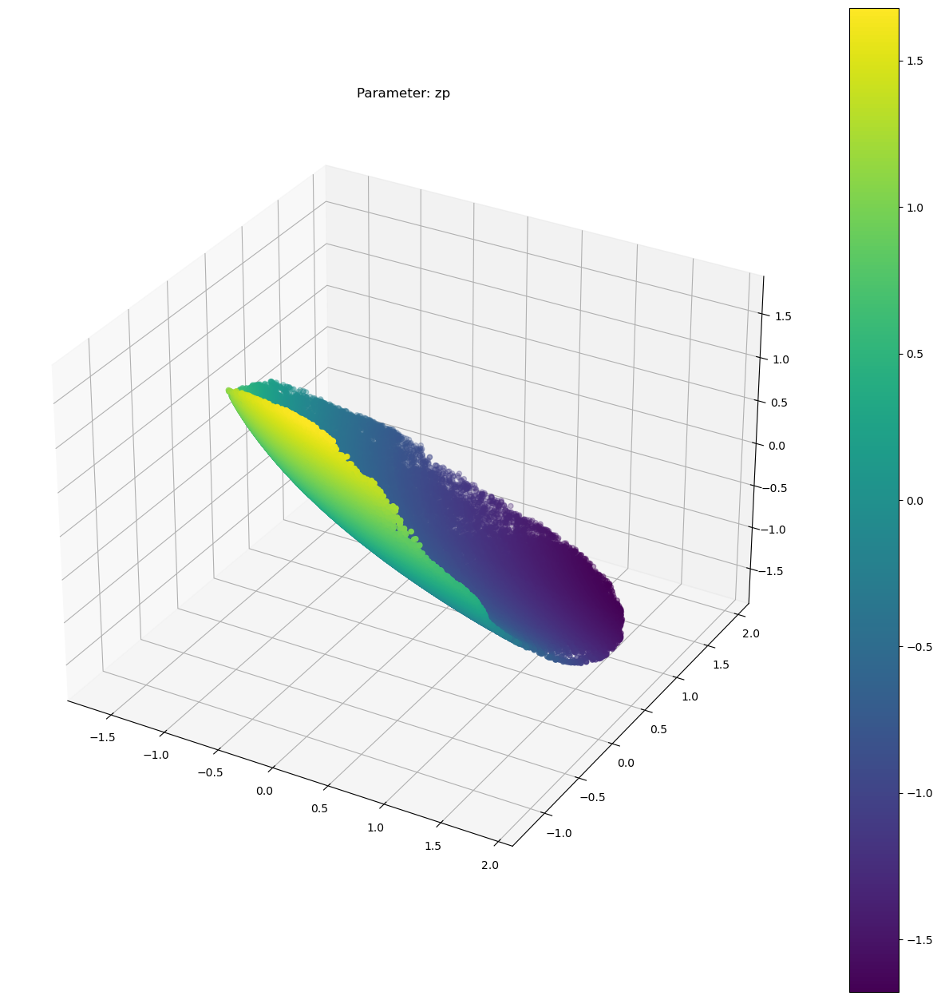

In [106]:
fast_param_dist_3Dplot(
    clustering_dataset_recovered['xp'],
    clustering_dataset_recovered['yp'],
    clustering_dataset_recovered['zp'],
    clustering_dataset_recovered['zp']
)

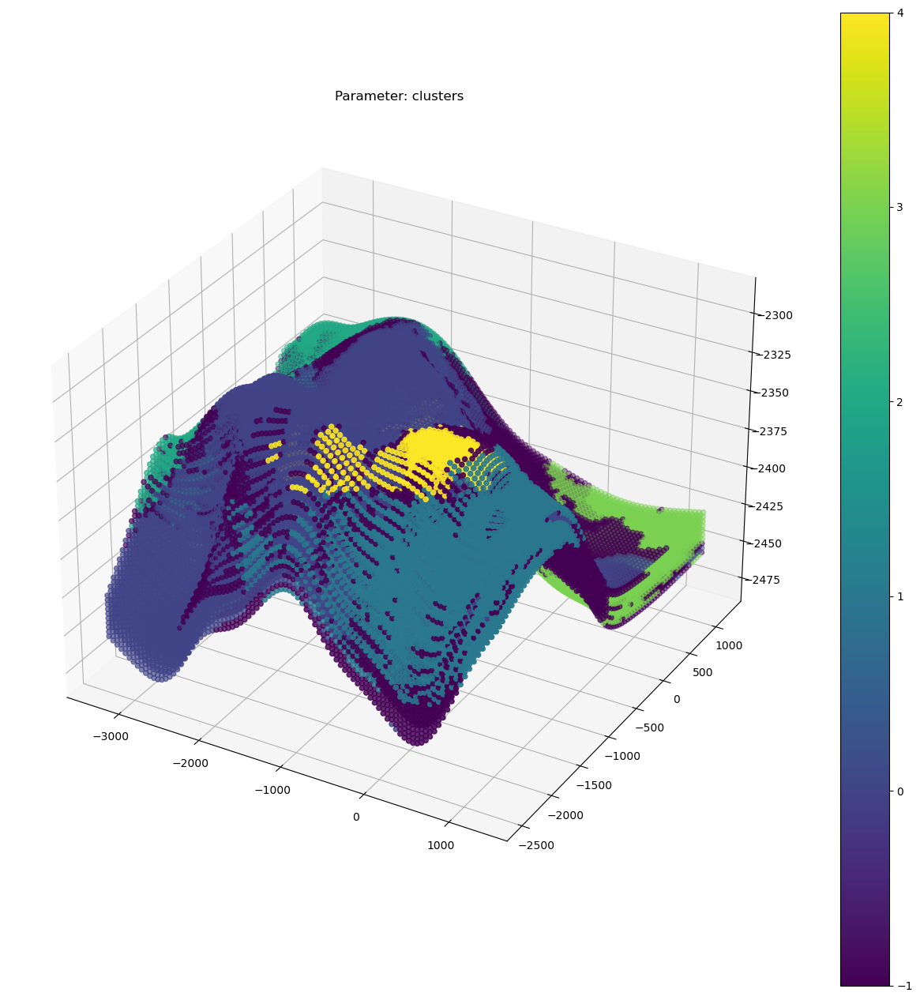

In [105]:
fast_param_dist_3Dplot(
    clustering_dataset['xp'],
    clustering_dataset['yp'],
    clustering_dataset['zp'],
    ds_reduced_clustered['clusters']
)

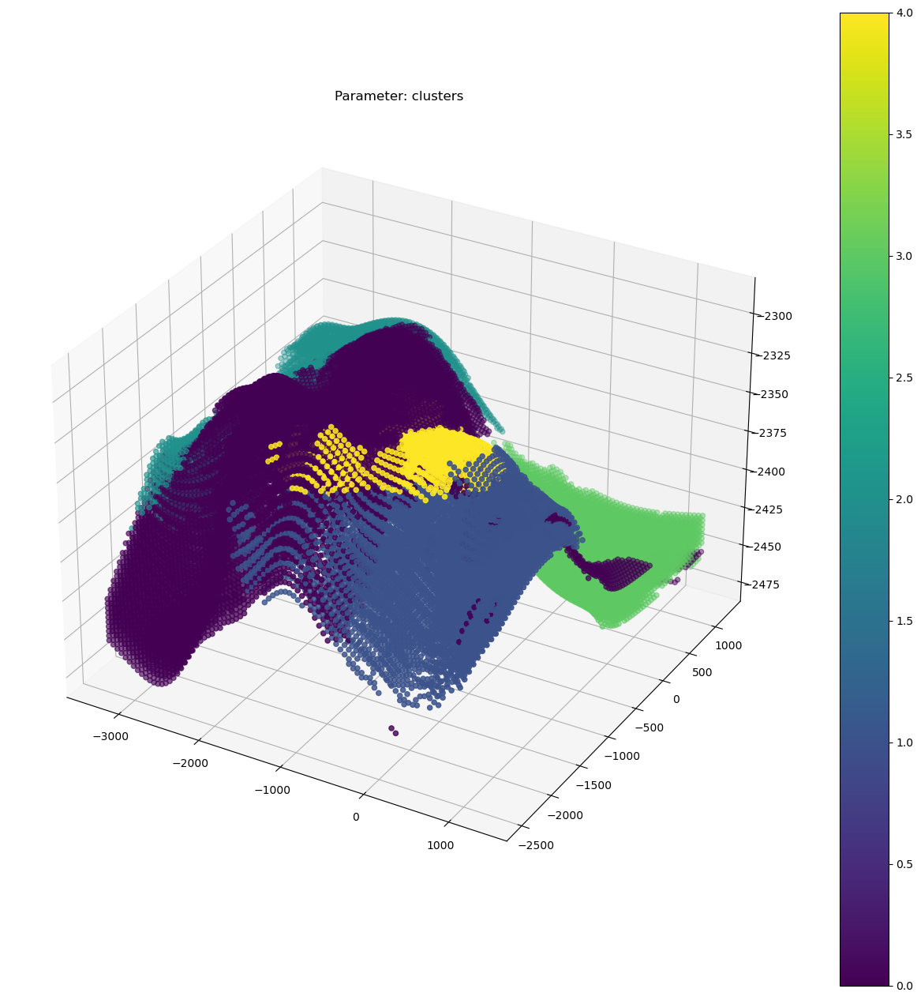

In [218]:
ds_reduced_clusters_only1 = clustering_dataset.copy()
ds_reduced_clusters_only1['clusters'] = ds_reduced_clustered.clusters
ds_reduced_clusters_only1 = ds_reduced_clusters_only1[ds_reduced_clustered.clusters != -1]
fast_param_dist_3Dplot(
    ds_reduced_clusters_only1['xp'],
    ds_reduced_clusters_only1['yp'],
    ds_reduced_clusters_only1['zp'],
    ds_reduced_clusters_only1['clusters']
)

### Algorytm wykorzystywany w analizie CT

In [89]:
#cluster_slices = ds_clustered2.groupby('zp').size().to_frame()
clustering_dataset['zp'].value_counts()

-2,329.31    8
-2,326.31    8
-2,332.31    8
-2,338.76    8
-2,341.17    7
            ..
-2,361.26    1
-2,365.34    1
-2,367.26    1
-2,373.02    1
-2,426.60    1
Name: zp, Length: 44667, dtype: int64

In [93]:
clustering_dataset['zp'].round(1).value_counts()

-2,337.60    97
-2,334.60    96
-2,333.80    90
-2,337.80    89
-2,336.80    88
             ..
-2,462.80     1
-2,467.70     1
-2,473.40     1
-2,473.20     1
-2,296.50     1
Name: zp, Length: 1773, dtype: int64

In [117]:
clustering_dataset['yp'].round(0).value_counts()

-2,478.00    940
322.00       940
222.00       940
172.00       940
122.00       940
            ... 
-1,278.00    940
-1,328.00    940
-1,378.00    940
-1,428.00    940
1,222.00     940
Name: yp, Length: 75, dtype: int64

<AxesSubplot: xlabel='xp', ylabel='zp'>

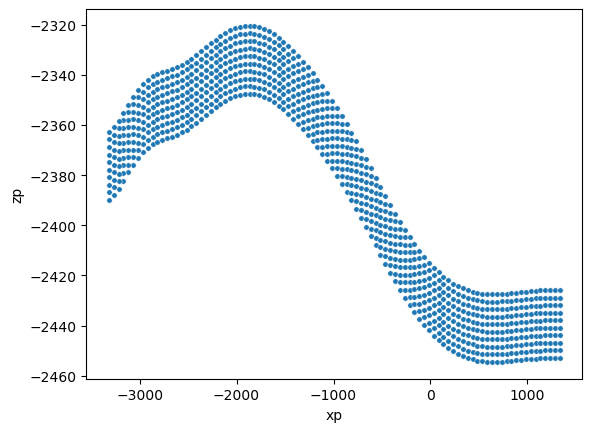

In [108]:
test = clustering_dataset.loc[clustering_dataset['yp'].round(0) == 322.00]
sns.scatterplot(x=test['xp'], y=test['zp'], s=15)

In [125]:
eps_values = np.arange(1,100,0.5) # eps values to be investigated
min_samples = np.arange(1, 300, 5) # min_samples values to be investigated
#eps_values = [1, 10, 100]
#min_samples = [1, 10, 50]
results = dbscan_model(eps_values, min_samples, test)

eps: 1.0 min_samples: 1 ------------ 940
eps: 1.0 min_samples: 6 ------------ 1
eps: 1.0 min_samples: 11 ------------ 1
eps: 1.0 min_samples: 16 ------------ 1
eps: 1.0 min_samples: 21 ------------ 1
eps: 1.0 min_samples: 26 ------------ 1
eps: 1.0 min_samples: 31 ------------ 1
eps: 1.0 min_samples: 36 ------------ 1
eps: 1.0 min_samples: 41 ------------ 1
eps: 1.0 min_samples: 46 ------------ 1
eps: 1.0 min_samples: 51 ------------ 1
eps: 1.0 min_samples: 56 ------------ 1
eps: 1.0 min_samples: 61 ------------ 1
eps: 1.0 min_samples: 66 ------------ 1
eps: 1.0 min_samples: 71 ------------ 1
eps: 1.0 min_samples: 76 ------------ 1
eps: 1.0 min_samples: 81 ------------ 1
eps: 1.0 min_samples: 86 ------------ 1
eps: 1.0 min_samples: 91 ------------ 1
eps: 1.0 min_samples: 96 ------------ 1
eps: 1.0 min_samples: 101 ------------ 1
eps: 1.0 min_samples: 106 ------------ 1
eps: 1.0 min_samples: 111 ------------ 1
eps: 1.0 min_samples: 116 ------------ 1
eps: 1.0 min_samples: 121 ----------

In [130]:
results.sort_values('number_of_clusters', ascending=False)

,eps,min_samples,number_of_clusters
0,1.0,1.0,940.0
60,1.5,1.0,940.0
180,2.5,1.0,940.0
120,2.0,1.0,940.0
300,3.5,1.0,940.0
...,...,...,...
11151,93.5,256.0,1.0
11152,93.5,261.0,1.0
11153,93.5,266.0,1.0
11154,93.5,271.0,1.0


In [131]:
results[results['min_samples'] > 1].sort_values('number_of_clusters', ascending=False)

,eps,min_samples,number_of_clusters
5941,50.5,6.0,30.0
6061,51.5,6.0,28.0
6001,51.0,6.0,27.0
6241,53.0,6.0,23.0
6121,52.0,6.0,22.0
...,...,...,...
11146,93.5,231.0,1.0
11158,93.5,291.0,1.0
11159,93.5,296.0,1.0
11165,94.0,26.0,1.0


In [133]:
results[results['min_samples'] > 10].sort_values('number_of_clusters', ascending=False)

,eps,min_samples,number_of_clusters
9363,79.0,16.0,14.0
6782,57.5,11.0,14.0
9303,78.5,16.0,14.0
6842,58.0,11.0,14.0
7022,59.5,11.0,14.0
...,...,...,...
11285,95.0,26.0,1.0
11286,95.0,31.0,1.0
11287,95.0,36.0,1.0
11288,95.0,41.0,1.0


In [136]:
results[results['min_samples'] > 20].sort_values('number_of_clusters', ascending=False)

,eps,min_samples,number_of_clusters
11764,99.0,21.0,6.0
11524,97.0,21.0,6.0
11704,98.5,21.0,6.0
11824,99.5,21.0,6.0
11644,98.0,21.0,6.0
...,...,...,...
11261,94.5,206.0,1.0
11262,94.5,211.0,1.0
11243,94.5,116.0,1.0
11242,94.5,111.0,1.0


<AxesSubplot: xlabel='xp', ylabel='zp'>

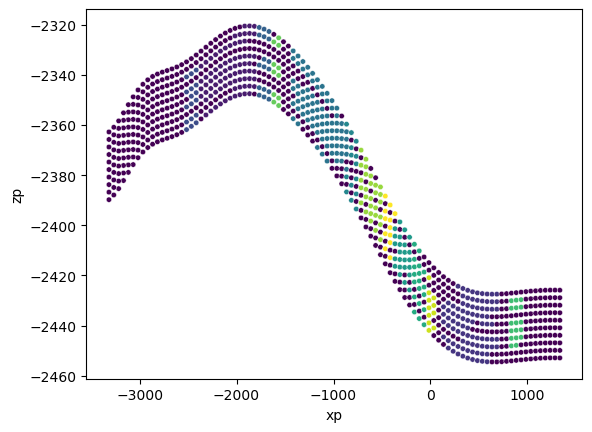

In [137]:
DBS_clustering_2 = DBSCAN(eps=79, min_samples=16)
DBS_clustering_2.fit(test)

ds_slice_clustered = pd.DataFrame(test)
ds_slice_clustered['clusters'] = DBS_clustering_2.labels_

#ds_clusters_only = ds_clustered[ds_clustered.clusters != -1]

DBSCAN_cluster_sizes2 = ds_slice_clustered.groupby('clusters').size().to_frame()
DBSCAN_cluster_sizes2.head()
sns.scatterplot(x=ds_slice_clustered['xp'], y=ds_slice_clustered['zp'], c=ds_slice_clustered['clusters'], s=15)

<AxesSubplot: xlabel='xp', ylabel='zp'>

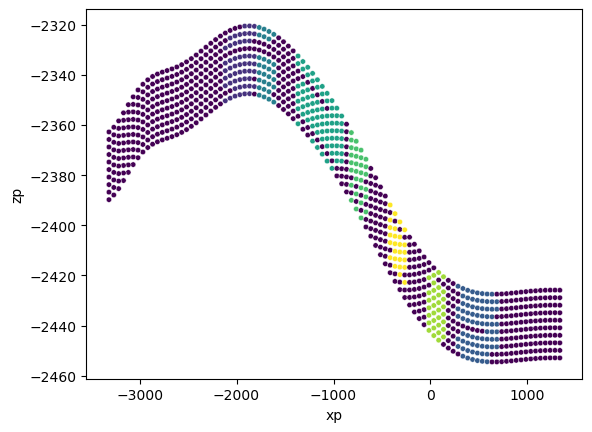

In [141]:
DBS_clustering_2 = DBSCAN(eps=99, min_samples=20)
DBS_clustering_2.fit(test)

ds_slice_clustered = pd.DataFrame(test)
ds_slice_clustered['clusters'] = DBS_clustering_2.labels_

#ds_clusters_only = ds_clustered[ds_clustered.clusters != -1]

DBSCAN_cluster_sizes2 = ds_slice_clustered.groupby('clusters').size().to_frame()
DBSCAN_cluster_sizes2.head()
sns.scatterplot(x=ds_slice_clustered['xp'], y=ds_slice_clustered['zp'], c=ds_slice_clustered['clusters'], s=15)

In [181]:
def ct_model_clustering(data, coord1, coord2, coord_slice, max_samples):
    dataset = data.copy()
    dataset['clusters'] = None
    for num in [4, 3, 2, 1, 0]:
        if len(pd.unique(dataset[coord_slice].round(num))) < max_samples:
            round_value = num

    for slice in pd.unique(dataset[coord_slice].round(round_value)):

        clustering_model = DBSCAN(eps=99, min_samples=20)
        clustering_model.fit(dataset.loc[dataset[coord_slice].round(round_value) == slice].iloc[:,:-1])

        dataset['clusters'].loc[dataset[coord_slice].round(round_value) == slice] = clustering_model.labels_

    return dataset


In [183]:
test = ct_model_clustering(clustering_dataset, 'xp', 'zp', 'yp', 200)

/var/folders/r6/sgbmy7v556bcgn5krrfy1j3c0000gn/T/ipykernel_53860/1866438913.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/r6/sgbmy7v556bcgn5krrfy1j3c0000gn/T/ipykernel_53860/1866438913.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/r6/sgbmy7v556bcgn5krrfy1j3c0000gn/T/ipykernel_53860/1866438913.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/r6/sgbmy7v556bcgn5krrfy1j3c0000gn/T/ipy

In [185]:
test['clusters'].value_counts()

-1     35937
 1      7828
 0      7348
 2      7224
 3      4588
 4      3284
 5      2141
 6      1003
 7       635
 8       220
 9       153
 10       81
 11       36
 13       15
 12        7
Name: clusters, dtype: int64

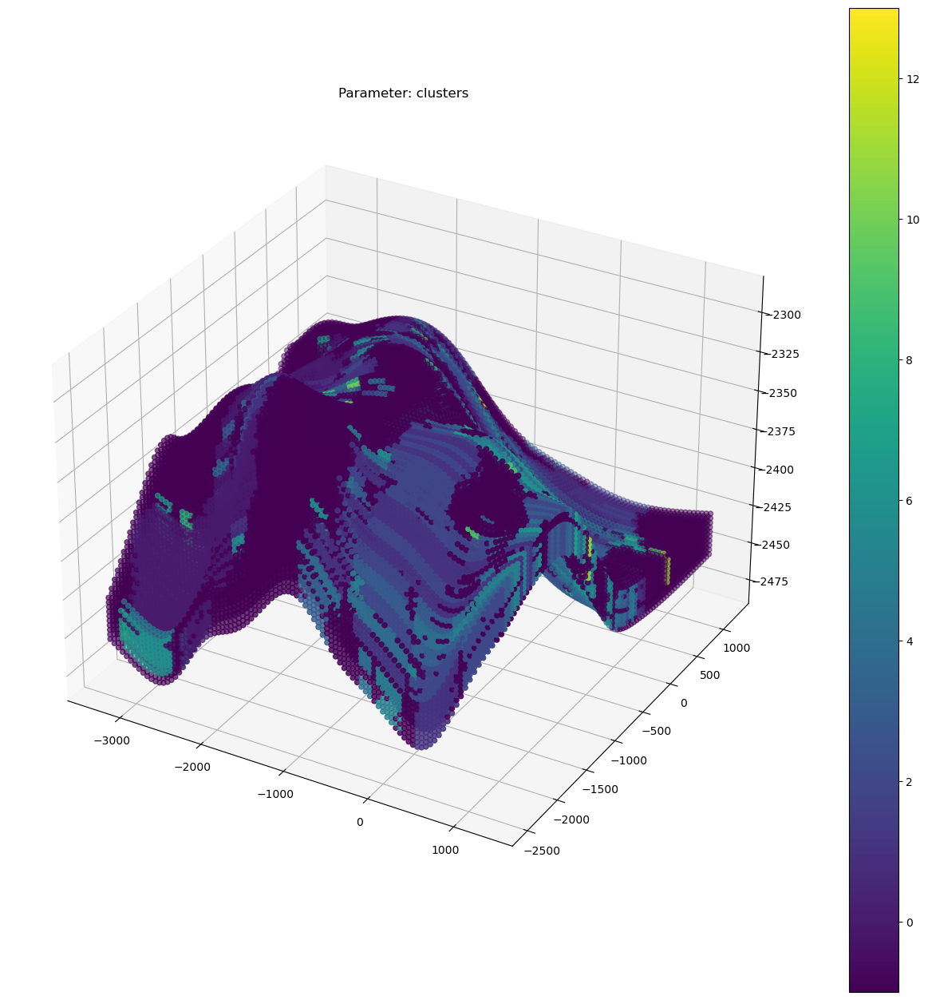

In [184]:
fast_param_dist_3Dplot(test['xp'], test['yp'],test['zp'],test['clusters'])
    

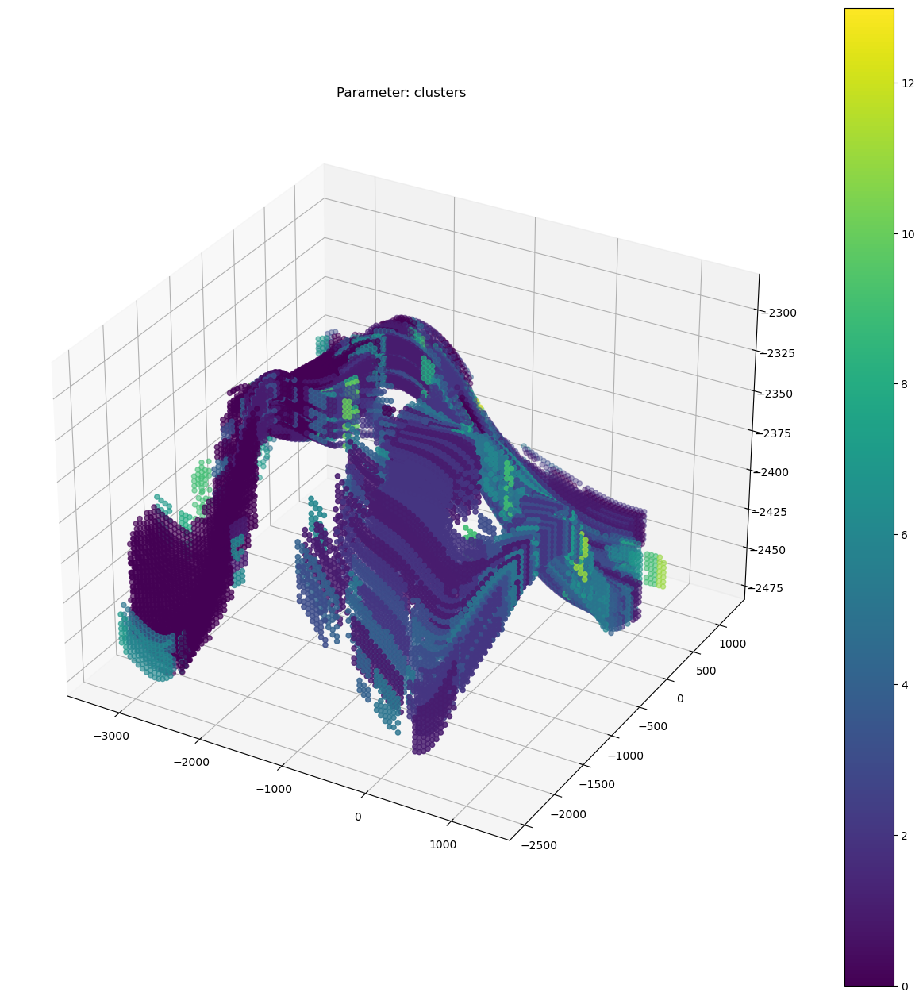

In [219]:
ds_CT_clusters_only1 = test[test.clusters != -1]
fast_param_dist_3Dplot(
    ds_CT_clusters_only1['xp'],
    ds_CT_clusters_only1['yp'],
    ds_CT_clusters_only1['zp'],
    ds_CT_clusters_only1['clusters']
)

In [188]:
test2 = ct_model_clustering(clustering_dataset, 'yp', 'zp', 'xp', 200)
test2['clusters'].value_counts()

/var/folders/r6/sgbmy7v556bcgn5krrfy1j3c0000gn/T/ipykernel_53860/1866438913.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/r6/sgbmy7v556bcgn5krrfy1j3c0000gn/T/ipykernel_53860/1866438913.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/r6/sgbmy7v556bcgn5krrfy1j3c0000gn/T/ipykernel_53860/1866438913.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/r6/sgbmy7v556bcgn5krrfy1j3c0000gn/T/ipy

-1    36169
 0     9980
 1     8369
 2     7089
 3     4610
 4     2497
 5     1112
 6      452
 7      192
 8       23
 9        7
Name: clusters, dtype: int64

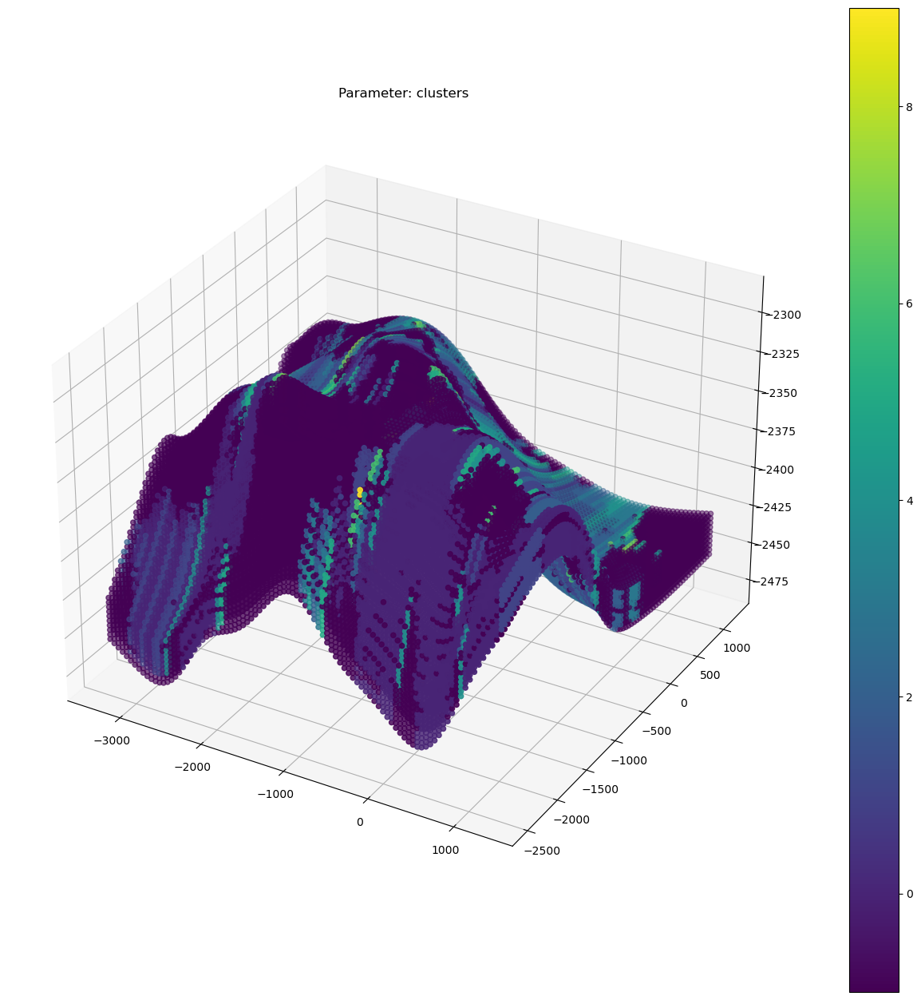

In [189]:
fast_param_dist_3Dplot(test2['xp'], test2['yp'],test2['zp'],test2['clusters'])

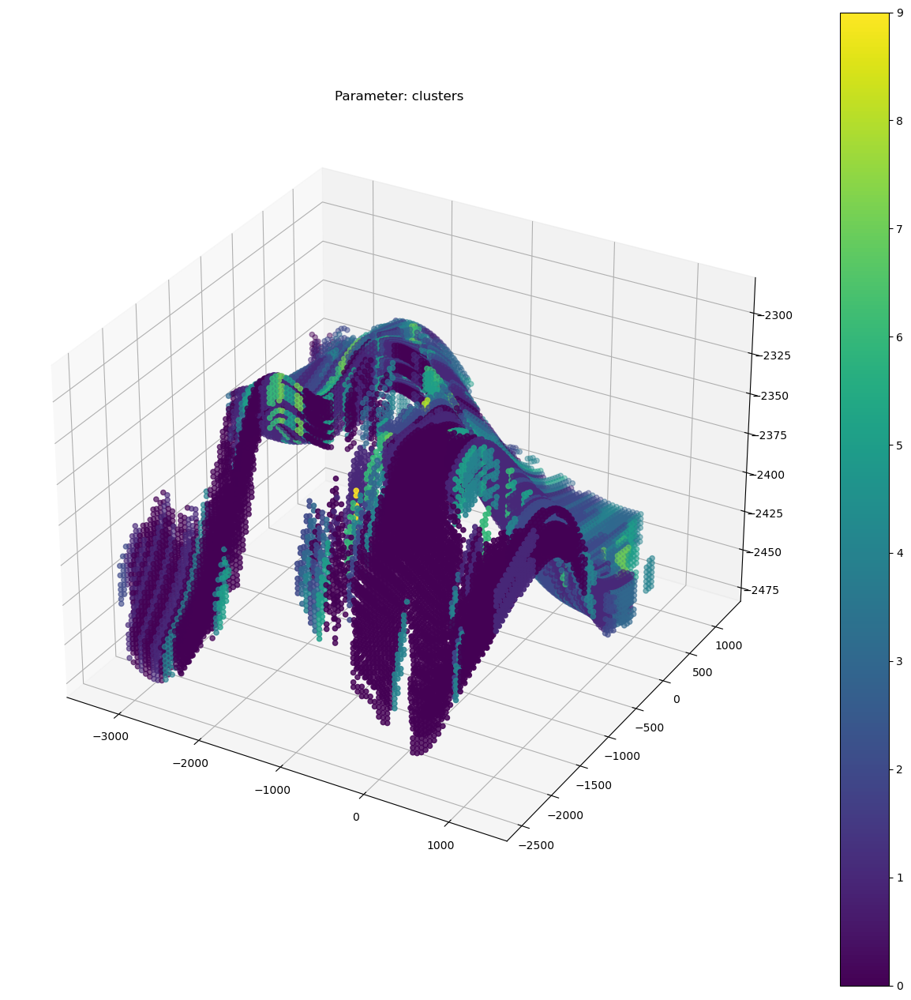

In [220]:
ds_CT_clusters_only2 = test2[test2.clusters != -1]
fast_param_dist_3Dplot(
    ds_CT_clusters_only2['xp'],
    ds_CT_clusters_only2['yp'],
    ds_CT_clusters_only2['zp'],
    ds_CT_clusters_only2['clusters']
)

In [178]:
test66 = clustering_dataset.copy()
test66['test'] = 0
test66['NTG'].loc[test66['PORO'] == 0.1139] = 69
test66.iloc[:,:-1]

/var/folders/r6/sgbmy7v556bcgn5krrfy1j3c0000gn/T/ipykernel_53860/3611249002.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,i_index,j_index,k_index,PORV,PERMX,NTG,PORO,PRESSURE,SOIL,xp,yp,zp
0,1,1,10,648.204895,57.345901,69.0000,0.1139,286.823700,0.0,-3315.909912,-2478.280029,-2454.367432
1,2,1,10,619.863953,56.368698,0.7269,0.1137,287.015778,0.0,-3265.909912,-2478.280029,-2456.317383
2,3,1,10,591.032715,54.343399,0.7074,0.1114,287.210327,0.0,-3215.909912,-2478.280029,-2458.292480
3,4,1,10,575.247742,51.114101,0.7115,0.1078,287.407349,0.0,-3165.909912,-2478.280029,-2460.292480
4,5,1,10,540.924927,47.161598,0.7148,0.1009,287.605835,0.0,-3115.909912,-2478.280029,-2462.307373
...,...,...,...,...,...,...,...,...,...,...,...,...
70495,90,75,1,338.371796,25.261801,0.7943,0.0568,284.340240,0.0,1134.089966,1221.719971,-2429.155029
70496,91,75,1,360.183014,24.006800,0.8455,0.0568,284.278412,0.0,1184.089966,1221.719971,-2428.527344
70497,92,75,1,348.777893,23.396500,0.8334,0.0558,284.215393,0.0,1234.089966,1221.719971,-2427.887451
70498,93,75,1,315.881989,23.081900,0.7630,0.0552,284.151855,0.0,1284.089966,1221.719971,-2427.242432


redukcja wymiarowości PCA
visual inspection
czysta analiza 2D
iteracja po sliceach

transformacja do 2D i transformacja wsteczna